<h1 align = 'center'>Computer Vision Final Project: Breast Cancer Tumor Classification</h1>
<h2 align = 'center'>Section 1 Spring 2023</h2>
<h3 align = 'center'> Nicholas Lee, Nic Brathwaite, cnn Moayed</h3>

<h4 align = 'center'><a href = "https://github.com/NickBrath/Computer-Vision-281-Final-Project">Github Repository</a></h4>

<p align = 'center'><a href="https://colab.research.google.com/github/NickBrath/Computer-Vision-281-Final-Project/blob/main/Nick_Lee_Baseline_Models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a></p>


# Introduction

Breast cancer is the most prevalent form of cancer, accounting for 2,261,419 (11.7%) of the 19,292,789 cases reported worldwide in 2020 according to the world health organization. Early diagnosis of cancer is crucial in ensuring the best chances of recovery. One main method is biopsing tissue for tumor detection using immunohistochemistry staining. Staining tissues is labor and time intensive, and training an expert to interpret the results takes even longer. Even experts have bias in their analysis so a lot of research has been geared towards using machine learning and computer vision to help detect cancer faster and at scale. The purpose of this project is to create a tool to help experts classify breast tumors as either benign or malignant (cancerous) subtypes from histopathological images.

<u>Data</u>  
The Breast Cancer Histopathological Image Classification (BreakHis) is composed of 9,109 microscopic images of breast tumor tissue collected from 82 patients using different magnifying factors (40X, 100X, 200X, and 400X). The dataset contains 2,480 benign and 5,429 malignant samples (700X460 pixels, 3-channel RGB, 8-bit depth in each channel, PNG format). In total there are two major classes of identification: benign and malignant. Furthermore, there are eight sub categories of classification, 4 in each of the main categories.


<center><img src="..\imgs\tumor_classification_tree.png" alt="map of tumor classification" height = 400 width = 600/></center>


Possible features of benign tumors to look for in images:
histologically benign [1]
(adjective) Referring to a lesion that does not meet any criteria of malignancy – e.g., marked cellular atypia, mitosis, disruption of basement membranes, metastasize.


A study conducted to understand the patterns used by pathologists showe dthat diagnostic accuracy varied as a function of case consensus diagnosis, and bening cases often elicited false positives. While the three malignant cases often were categorized as false negative. "Pathologist experience levels, case consensus diagnosis, case difficulty, eye fixation durations, and the extent to which pathologists’ eyes fixated within versus outside of diagnostic ROIs, all independently or interactively predicted diagnostic accuracy. Higher zooming behavior predicted a tendency to over-interpret benign and atypia cases, but not DCIS cases." (Brunye et al. 2017).


---


# Setup


## Packages


In [1]:
# Google packages
# from google.colab import drive
# from google.colab import files
# from google.colab.patches import cv2_imshow

# Mount google drive
# drive.mount('/content/drive')


In [2]:
# high resolution images
%config InlineBackend.figure_format = 'retina'


In [3]:
import sys
import os
import datetime

# DS packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from datetime import date
import warnings

# ML packages

from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTEN

import scipy as sc
import sklearn as sk
import tensorflow as tf
from tensorflow import keras
from keras.utils import plot_model
from tensorflow.keras.layers import Conv2D, Flatten, Dense, Dropout, MaxPooling2D, BatchNormalization
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.metrics import Accuracy, binary_crossentropy, FalsePositives, FalseNegatives, TruePositives, TrueNegatives
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, Callback, ModelCheckpoint

# import tensorflow_addons as tfa

from skimage import exposure, data, img_as_float, img_as_ubyte
from skimage.color import rgb2gray
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from sklearn.metrics import confusion_matrix, classification_report


import tomopy
import mkl

from imgaug import augmenters as iaa

# Local packages for functions
sys.path.insert(1, '../scripts')

# data loading functions
import data_loading as dl
import dataset_creation_functions as dcf

## Image set functions
# For showing images and creating sets for plotting
import image_viewing_functions as ivf

## Augmentation functions
import augmentation_functions as af

## Model functions, like plotting history
import model_functions as mf

# Data generator for ResNet model or other models as well
import data_generator as dg

In [4]:
# options
pd.options.display.max_columns = 50
warnings.filterwarnings("ignore")

# Intel(R) MKL FFT functions to run sequentially
mkl.domain_set_num_threads(1, domain='fft')

og_cmap = plt.get_cmap(name=None, lut=None)

AUTOTUNE = tf.data.AUTOTUNE
seed = tf.random.uniform((2,), minval=0, maxval=65536).numpy().astype("int32")

%matplotlib inline
%load_ext tensorboard


In [5]:
# print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
# tf.config.list_physical_devices('GPU')


## Functions


### EDA functions


In [6]:
# Exploratory creation for std and min max of images. Uncomment to run, but should have csv already saved
# %run ../../scripts/eda_functions.py


### Model Functions


In [7]:
def get_tensor_image_labels(ds):
    """ Extract image arrays and labels from tensor dataset """

    imgs = np.concatenate([x for x, y in ds], axis=0)
    labels = np.concatenate([y for x, y in ds], axis=0)
    return imgs, labels

In [8]:
def launch_tensorboard(log_name):
    %tensorboard - -logdir f'./models/logs/{log_name}'


In [9]:
# @tf.function
def histogram_equalization(im):
    """ Histogram Equalization Contrast

      Args: 
          im (array): image to apply function to in rgb format

      Returns: 
          equalized_image (array): modified version of original image as ubtye format

    """
    gray = rgb2gray(im)
    conversion = img_as_ubyte(gray)
    img_cdf, bins = exposure.cumulative_distribution(conversion, 256)
    container = np.zeros(256)
    container[bins] = img_cdf

    holding_image = np.empty(im.shape)

    for i in range(im.shape[0]):
        for y in range(im.shape[1]):
            holding_image[i][y] = container[conversion[i][y]]

    equalized_image = img_as_ubyte(holding_image)

    return holding_image


def edge_detection(image):
    # Construct a HOG for each image and edge detection

    filter = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])
    gradients = sc.ndimage.convolve(image, filter)

    histograms = hog(image, orientations=7, pixels_per_cell=(16, 16))

    return gradients, histograms


## File Paths


In [10]:
# Paths
main_path = "G:\\My Drive\\"

project_path = "w281_final_project"
project_path = os.path.join(main_path, project_path)

datadir = os.path.join(project_path, "Data")

save_path = "".join([date.today().strftime('%Y%m%d'), "_baseline_models/"])
save_path = "".join([project_path, save_path])

# Sanity Check
print("project path: ", project_path)
print("Data directory", datadir)
print("save path: ", save_path)


project path:  G:\My Drive\w281_final_project
Data directory G:\My Drive\w281_final_project\Data
save path:  G:\My Drive\w281_final_project20230425_baseline_models/


### Load tensorflow dataset to use in models


In [11]:
# load metadata information for full paths and annotations
df = dl.load_pickles(os.path.join(datadir, "pickles\metaData.pkl"))

# starting with 40x
# df = df.query('MAGNIFICATION == "40" & TUMOR_CLASS == "B"').reset_index(drop=True)

# swap beginning path from google drive to local computer path
swap_gdrive = True
if swap_gdrive:
    pattern = "/content/drive/MyDrive/"
    replacement = "G:/My Drive/"

    df['FULL_PATH'] = df['FULL_PATH'].str.replace(pattern, replacement)

df.info()

display(df['TUMOR_TYPE'].value_counts())

df.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7909 entries, 0 to 7908
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   BIOPSY_PROCEDURE  7909 non-null   object
 1   TUMOR_CLASS       7909 non-null   object
 2   TUMOR_TYPE        7909 non-null   object
 3   YEAR              7909 non-null   object
 4   SLIDE_ID          7909 non-null   object
 5   MAGNIFICATION     7909 non-null   object
 6   SEQ               7909 non-null   object
 7   FULL_PATH         7909 non-null   object
 8   BASE_NAME         7909 non-null   object
dtypes: object(9)
memory usage: 556.2+ KB


DC    3451
F     1014
MC     792
LC     626
TA     569
PC     560
PT     453
A      444
Name: TUMOR_TYPE, dtype: int64

,BIOPSY_PROCEDURE,TUMOR_CLASS,TUMOR_TYPE,YEAR,SLIDE_ID,MAGNIFICATION,SEQ,FULL_PATH,BASE_NAME
0,SOB,B,A,14,22549AB,100,004,G:/My Drive/w281_final_project/Data/BreaKHis_v...,SOB_B_A-14-22549AB-100-004.png
1,SOB,B,A,14,22549AB,100,002,G:/My Drive/w281_final_project/Data/BreaKHis_v...,SOB_B_A-14-22549AB-100-002.png
2,SOB,B,A,14,22549AB,100,003,G:/My Drive/w281_final_project/Data/BreaKHis_v...,SOB_B_A-14-22549AB-100-003.png
3,SOB,B,A,14,22549AB,100,001,G:/My Drive/w281_final_project/Data/BreaKHis_v...,SOB_B_A-14-22549AB-100-001.png
4,SOB,B,A,14,22549AB,100,007,G:/My Drive/w281_final_project/Data/BreaKHis_v...,SOB_B_A-14-22549AB-100-007.png


In [12]:
pd.pivot_table(data=df[['MAGNIFICATION', 'TUMOR_CLASS']],
               index=['MAGNIFICATION'],
               columns=['TUMOR_CLASS'],
               #    values = ['YEAR'],
               aggfunc=np.count_nonzero,
               margins=True,
               margins_name='Total Count')


TUMOR_CLASS,B,M,Total Count
MAGNIFICATION,,,
100,1288,2874,2081
200,1246,2780,2013
40,1250,2740,1995
400,1176,2464,1820
Total Count,2480,5429,7908


In [13]:
pd.pivot_table(data=df[['MAGNIFICATION', 'TUMOR_CLASS', 'TUMOR_TYPE']],
               index=['MAGNIFICATION'],
               columns=['TUMOR_CLASS', 'TUMOR_TYPE'],
               #    values = ['YEAR'],
               aggfunc=np.count_nonzero,
               margins=True,
               margins_name='Total Count')


TUMOR_CLASS      B                      M                   Total Count
TUMOR_TYPE       A     F   PT    TA    DC    LC    MC    PC            
MAGNIFICATION                                                          
100            339   780  363   450  2709   510   666   426        2081
200            333   792  324   420  2688   489   588   405        2013
40             342   759  327   447  2592   468   615   435        1995
400            318   711  345   390  2364   411   507   414        1820
Total Count    888  2028  906  1138  6902  1252  1584  1120        7908

<Axes: ylabel='count'>

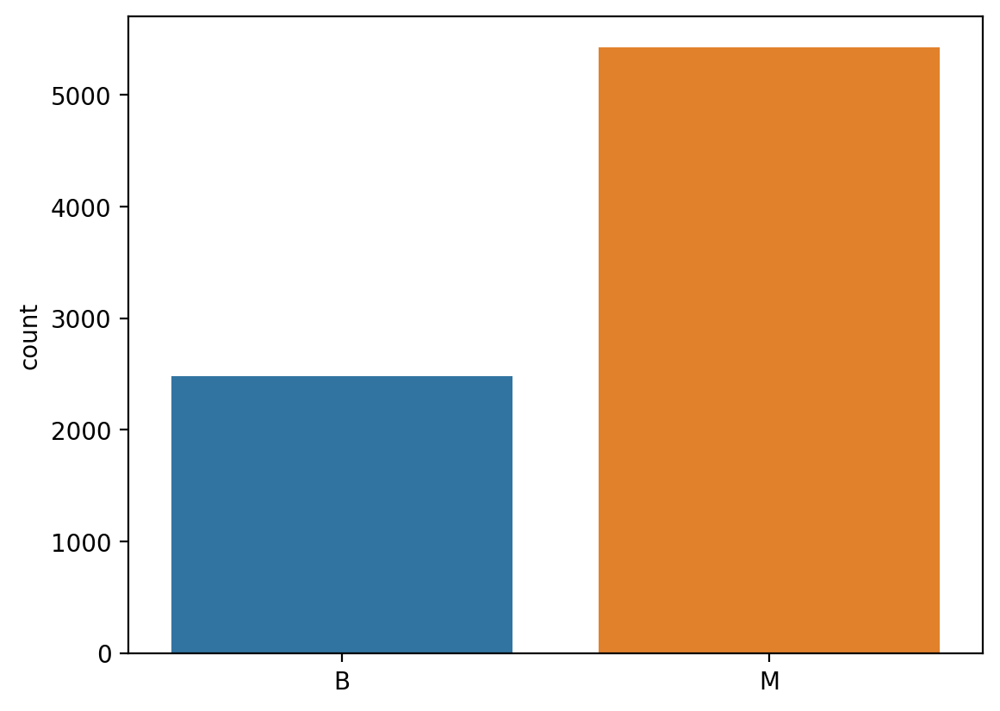

In [14]:
sns.countplot(x=df['TUMOR_CLASS'].values)


<Axes: ylabel='count'>

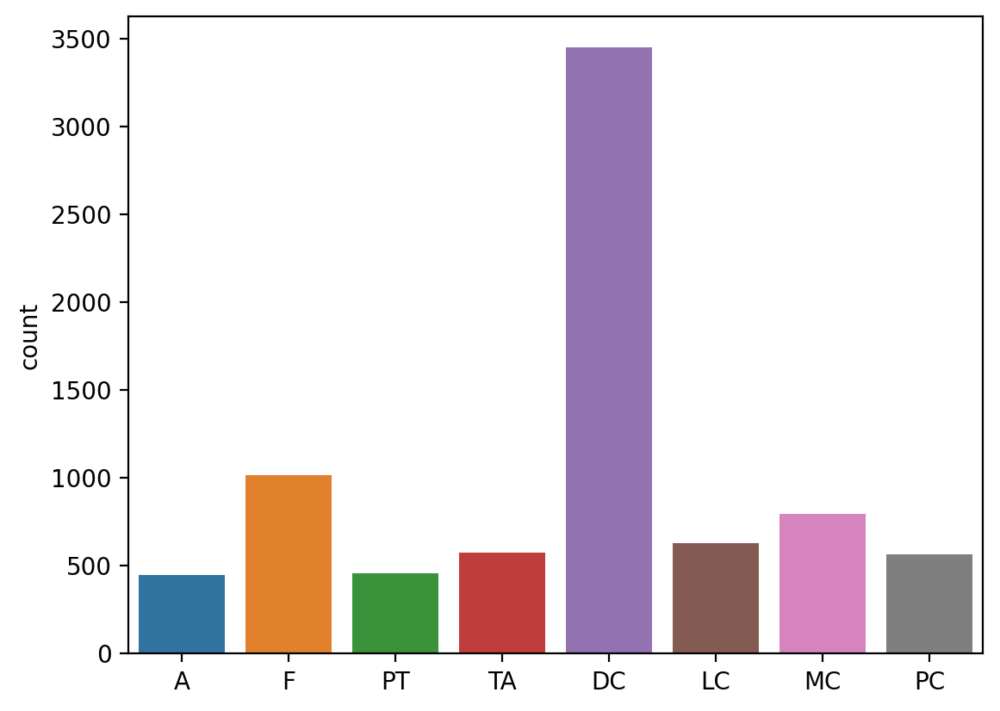

In [15]:
# check distribution of labels
sns.countplot(x=df['TUMOR_TYPE'].values)


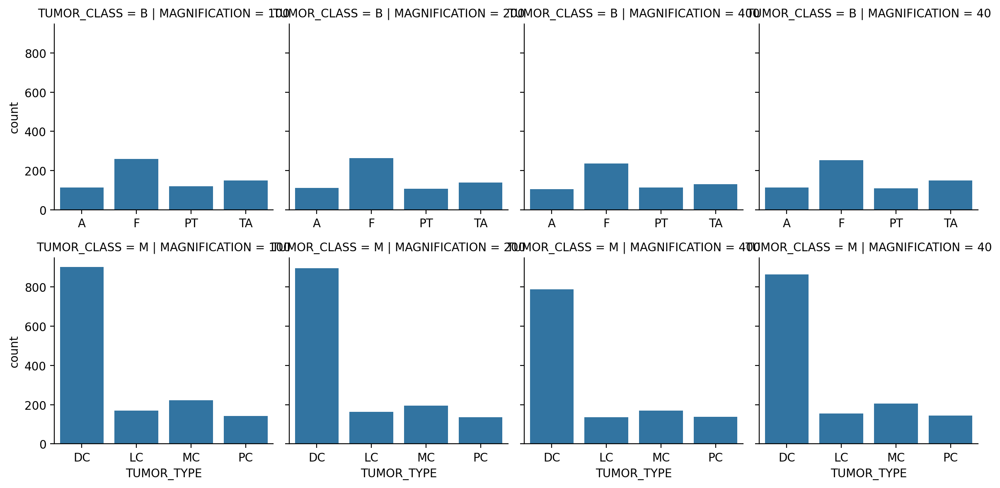

In [16]:
g = sns.FacetGrid(data=df, col='MAGNIFICATION',
                  row='TUMOR_CLASS', sharex=False)
g.tight_layout()
g.map_dataframe(sns.countplot, x='TUMOR_TYPE')


DC is by far the most prevelant in the dataset


### Examples of images


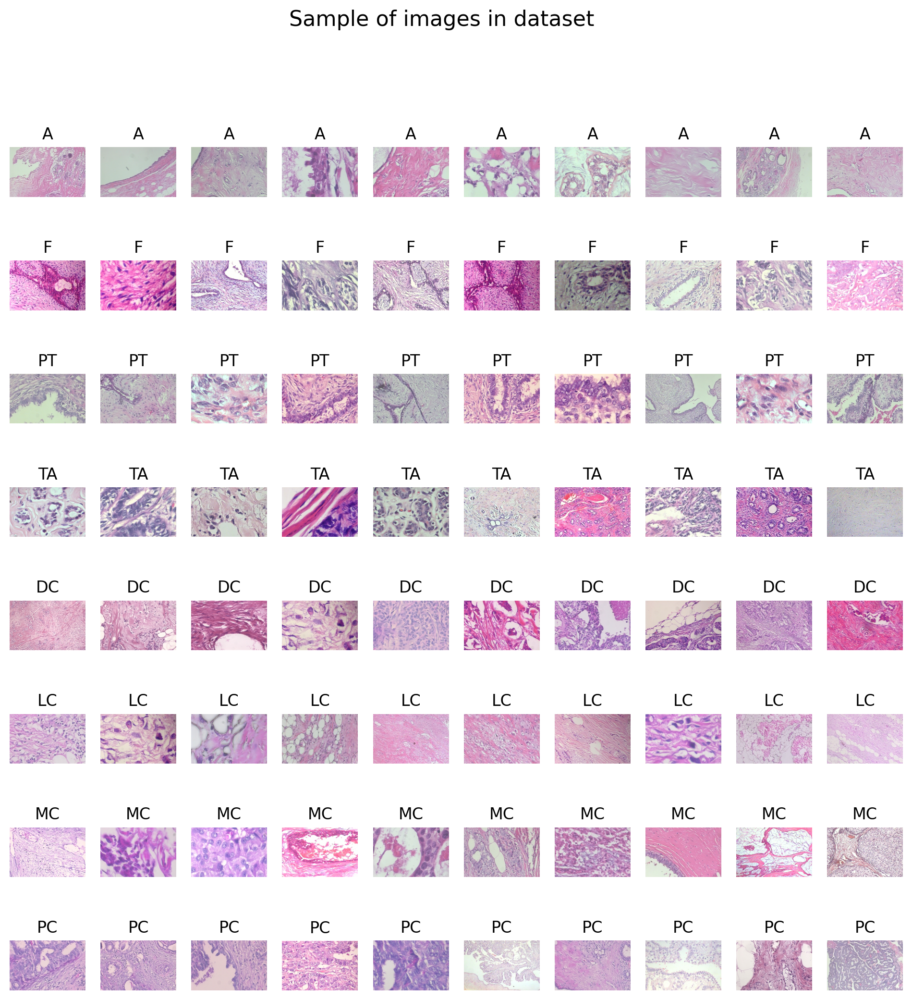

In [17]:
# Examples of images
df_temp = pd.concat([
    df.query('TUMOR_TYPE == "A"').sample(10).reset_index(drop=True),
    df.query('TUMOR_TYPE == "F"').sample(10).reset_index(drop=True),
    df.query('TUMOR_TYPE == "PT"').sample(10).reset_index(drop=True),
    df.query('TUMOR_TYPE == "TA"').sample(10).reset_index(drop=True),
    df.query('TUMOR_TYPE == "DC"').sample(10).reset_index(drop=True),
    df.query('TUMOR_TYPE == "LC"').sample(10).reset_index(drop=True),
    df.query('TUMOR_TYPE == "MC"').sample(10).reset_index(drop=True),
    df.query('TUMOR_TYPE == "PC"').sample(10).reset_index(drop=True),
]).reset_index(drop=True)

nrows = 8
ncols = 10

fig, axs = plt.subplots(nrows, ncols, figsize=(12, 12))

# Flatten axes to make it easier to access
axs = axs.flatten()

for i, file in enumerate(df_temp['FULL_PATH']):
    #read in file
    pic = plt.imread(file)

    # add image to axes
    axs[i].imshow(pic)

    # drop axis labels
    axs[i].axis('off')
    # add axes title
    axs[i].set(title=df_temp.loc[i, 'TUMOR_TYPE'])

fig.suptitle("Sample of images in dataset", fontsize=16);


Typically a trained histologist would evalulate the staining of each slide and rank them from 1-5 based on their own criteria. This provides issues when compariing tissues sections from different patients and labs. Processing the tissues and staining with hematoxylin and eosin can cause different artifcats to be present in the slides. Additional variations can come from image capture procedures. Luckily in this dataset the data curators used the same equipment and settings (_fact check please_). Regardless, it may be beneficial to normalize for brightness or intensity of colors. Initially our approach will be to use only grey scale images.


There are also gaps in some of the tissue that cause the area size to vary between slides.
Orientation could also be a challenge. The tissue is not always oriented the same way to the view of the tissue can change depending on how the parafin was sectioned and laid on a slide.


There are substructures within the images that histologist normally use to annotate these images. These features are important because the types of tissues that the cancer is affecting will change the appearance of the slide and staining profile. Understanding the effected cellular structures also helps to lead to diagnosises in the clinic. It would be interesting in future work to use this set to see what structures are effected by different types of cancer.


Below we exploring the differences in the RGB channels to determine if there might be hints to differences in the three channels. Since we did not see any drastic differeces between the standard deviation, minimum, and maximum, we determined that the colors may not be necessary to use as a feature.


In [18]:
color_variation = pd.read_csv(os.path.join(
    r"..\data", "color_variation.csv"))


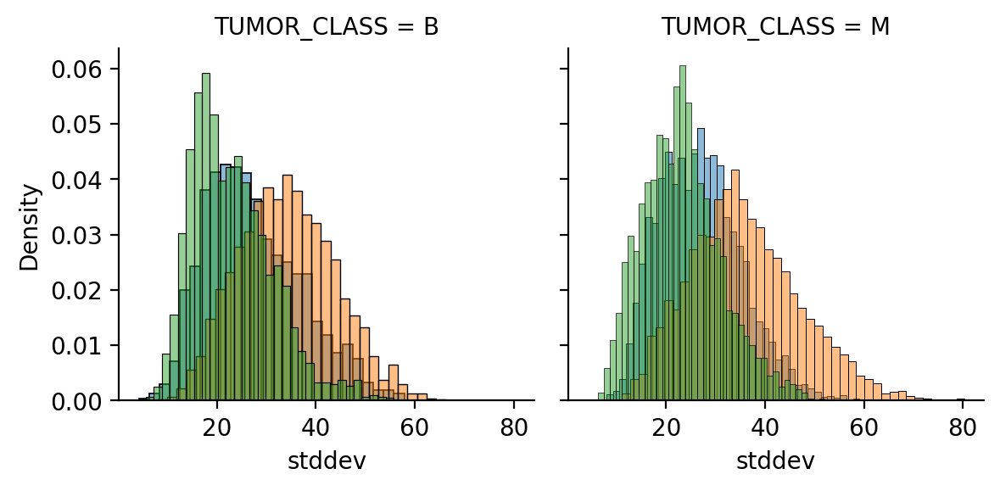

In [19]:
g = sns.FacetGrid(color_variation, col='TUMOR_CLASS', hue='channel')
g.map_dataframe(sns.histplot, x="stddev", stat="density",
                common_norm=False, alpha=0.5)


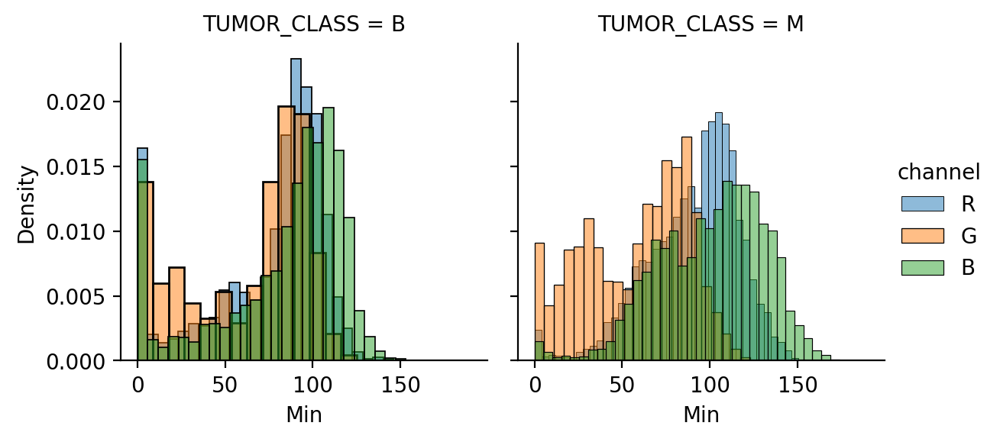

In [20]:
g = sns.FacetGrid(color_variation, col='TUMOR_CLASS', hue='channel')
g.map_dataframe(sns.histplot, x="Min", stat="density",
                common_norm=False, alpha=0.5)
g.add_legend()


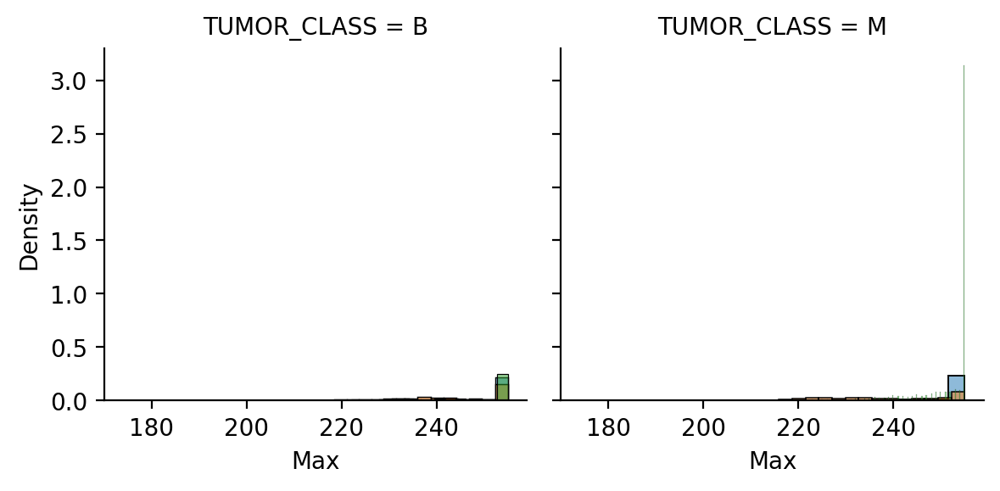

In [21]:
g = sns.FacetGrid(color_variation, col='TUMOR_CLASS', hue='channel')
g.map_dataframe(sns.histplot, x="Max", stat="density",
                common_norm=False,   alpha=0.5)


### Fixing unbalanced classes, creating datasets and encoding labels


In [12]:
ds_og, le_og = dcf.create_one_hot_encoding(
    file_paths=df['FULL_PATH'], labels=df['TUMOR_TYPE'])

# create label map to annotate confusion matrices
lc = le_og.classes_
lm_og = dict(zip(range(len(lc)), lc))

print(f"label map: {lm_og}")
print(f"Dataset og: {ds_og}")


label map: {0: 'A', 1: 'DC', 2: 'F', 3: 'LC', 4: 'MC', 5: 'PC', 6: 'PT', 7: 'TA'}
Dataset og: <TensorSliceDataset element_spec=(TensorSpec(shape=(), dtype=tf.string, name=None), TensorSpec(shape=(8,), dtype=tf.float32, name=None))>


In [13]:
x = df[['FULL_PATH']]
y = df[['TUMOR_TYPE']]

rus = RandomUnderSampler()

x_under, y_under = rus.fit_resample(x, y)
y_under.value_counts()

df_under = pd.concat([x_under, y_under], axis=1)
del x_under, y_under
df_under.TUMOR_TYPE.value_counts()

ds_under, le_under = dcf.create_one_hot_encoding(
    file_paths=df_under['FULL_PATH'], labels=df_under['TUMOR_TYPE'])

# create label map to annotate confusion matrices
lc = le_under.classes_
lm_under = dict(zip(range(len(lc)), lc))
lm_under


{0: 'A', 1: 'DC', 2: 'F', 3: 'LC', 4: 'MC', 5: 'PC', 6: 'PT', 7: 'TA'}

## Oversampling


In [14]:
ros = RandomOverSampler(random_state=0)
x_over, y_over = ros.fit_resample(x, y)

df_over_rand = pd.concat([x_over, y_over], axis=1)
del x_over, y_over
df_over_rand['TUMOR_TYPE'].value_counts()


A     3451
F     3451
PT    3451
TA    3451
DC    3451
LC    3451
MC    3451
PC    3451
Name: TUMOR_TYPE, dtype: int64

In [15]:
ds_over_rand, le_over_rand = dcf.create_one_hot_encoding(
    file_paths=df_over_rand['FULL_PATH'], labels=df_over_rand['TUMOR_TYPE'])

# create label map to annotate confusion matrices
lc = le_over_rand.classes_
lm_over_rand = dict(zip(range(len(lc)), lc))
lm_over_rand


{0: 'A', 1: 'DC', 2: 'F', 3: 'LC', 4: 'MC', 5: 'PC', 6: 'PT', 7: 'TA'}

## Using SMOTE for oversampling


In [16]:
sm = SMOTEN()
x_over, y_over = sm.fit_resample(x, y)

df_over_smote = pd.concat([x_over, y_over], axis=1)
del x_over, y_over
display(df_over_smote.TUMOR_TYPE.value_counts())

ds_over_smote, le_over_smote = dcf.create_one_hot_encoding(
    file_paths=df_over_smote['FULL_PATH'], labels=df_over_smote['TUMOR_TYPE'])

# create label map to annotate confusion matrices
lc = le_over_smote.classes_
lm_over_smote = dict(zip(range(len(lc)), lc))
lm_over_smote


A     3451
F     3451
PT    3451
TA    3451
DC    3451
LC    3451
MC    3451
PC    3451
Name: TUMOR_TYPE, dtype: int64

{0: 'A', 1: 'DC', 2: 'F', 3: 'LC', 4: 'MC', 5: 'PC', 6: 'PT', 7: 'TA'}

#### Cropping to random selection of image


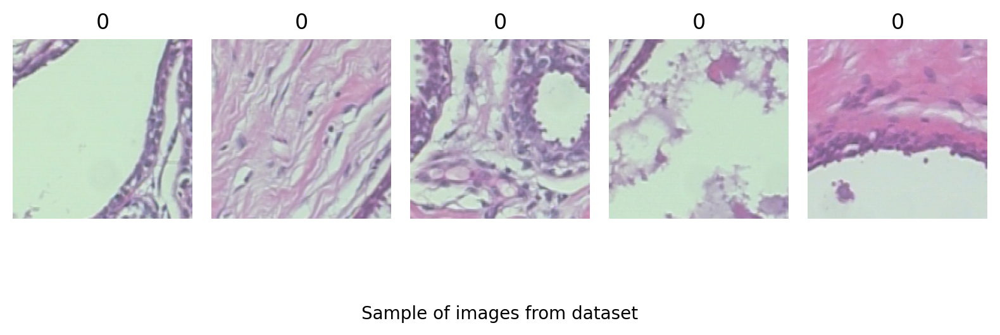

In [27]:
num_images = 5

ds_temp = ds_og.map(dcf.read_image).map(dcf.augment_crop)
images_base = ivf.create_image_set(ds_temp, num_images)

ivf.plot_images(images_base, 1, num_images)


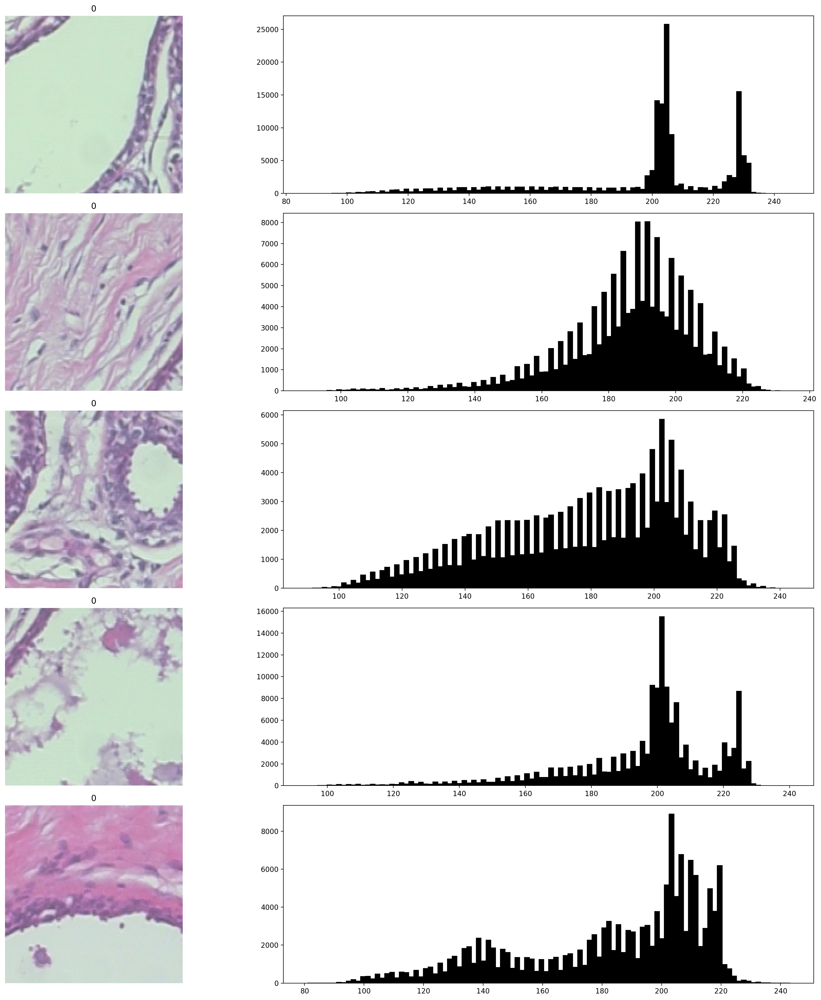

In [28]:
ivf.plot_images_with_histogram(images_base, nrows=len(images_base))


Various amounts of contrast are seen in this sample set. This can be due to the tissue structure, image artifacts such as shearing, and empty white space skewing the histogram profile.


Applying grayscale to images to understand if color is needed and test augmentations


In [29]:
ds_gray = ds_temp.map(af.augment_grayscale)
images_gray = ivf.create_image_set(ds_gray, num_images)


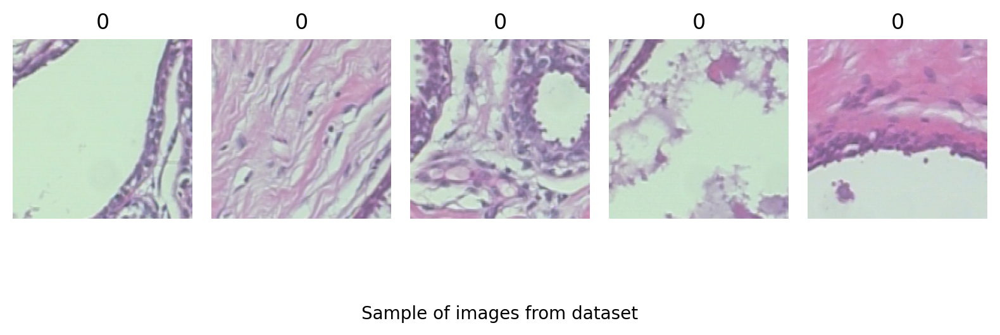

In [30]:
ivf.plot_images(images_base, 1, 5)

<Figure size 640x480 with 0 Axes>

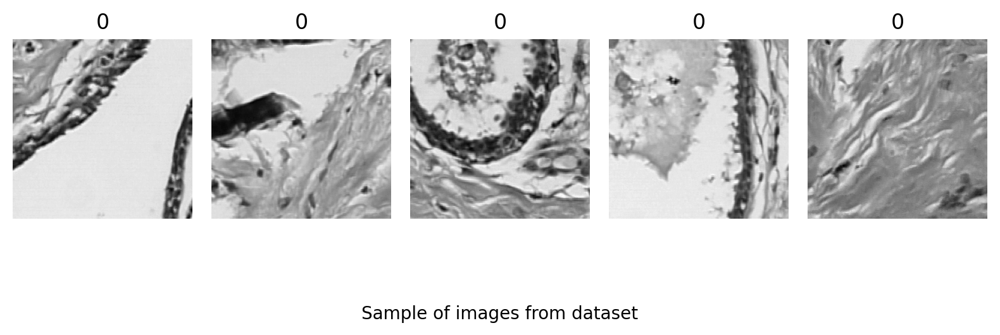

In [31]:
ivf.plot_images(images_gray, 1, 5, gray_scale=True)

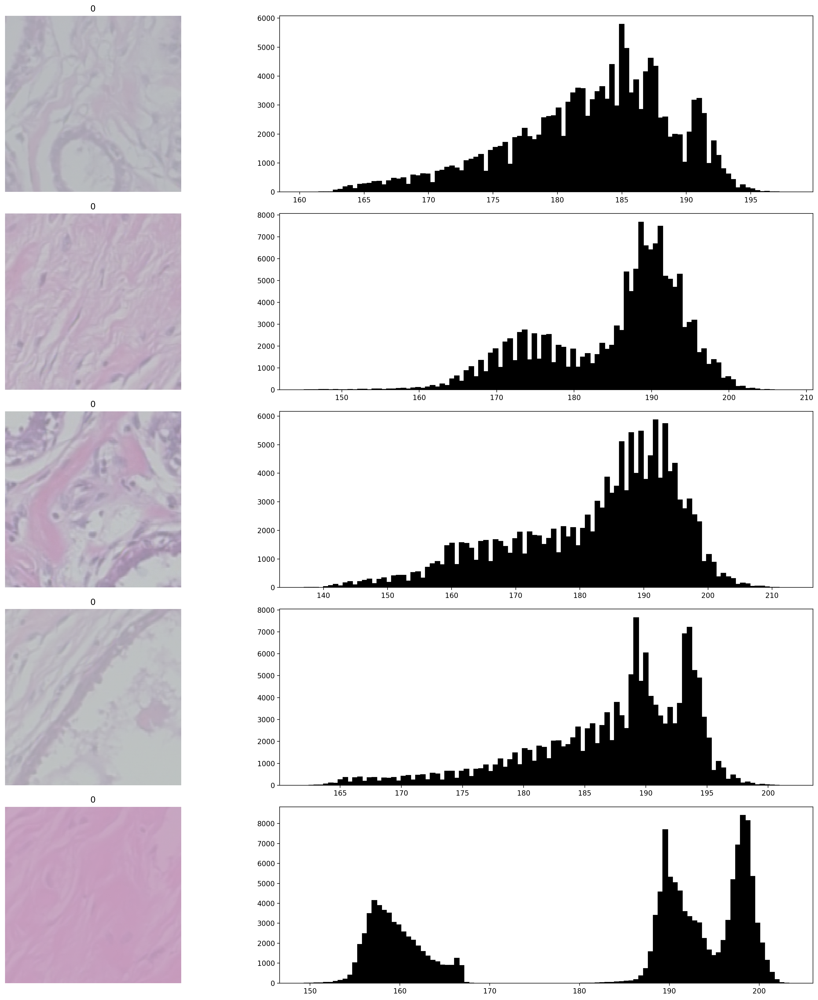

In [32]:
# Contrast
ds_temp = ds_temp.map(af.augment_contrast)
images_contrast = ivf.create_image_set(ds_temp, 5)

# create general view of images
# plot_images(images_contrast, nrows = len(images_contrast))
ivf.plot_images_with_histogram(images_contrast, nrows=len(images_contrast))


---


## Feature Engineering


Features to create from main paper

- local binary patterns (17) (LBP)
- completed LBP
- local phase quantization (LPQ)
- gray-level co-occurance matric (CLCM)
- threshold adjacency statistics (TAS)


More about [batched datasets](https://www.tensorflow.org/guide/data#batching_dataset_elements)


## Train, test split for RGB


5536
1583
1581
(224, 224, 3)
(8,)


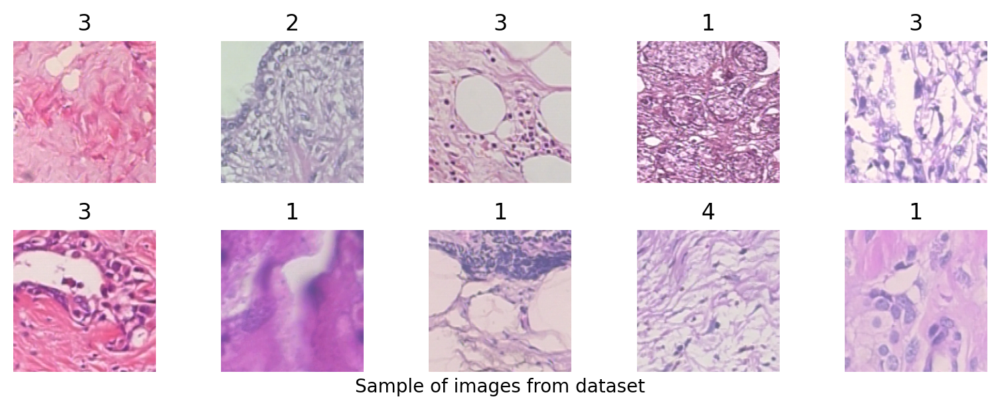

In [33]:
train_ds, val_ds, test_ds = dcf.preprocess_ds(
    ds_og, read_fn=dcf.read_image, augment_fn=dcf.augment_crop)

for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

train_sample = ivf.create_image_set(train_ds, num_images=10)
ivf.plot_images(train_sample, nrows=2, ncols=5)


### Adjusting Contrast


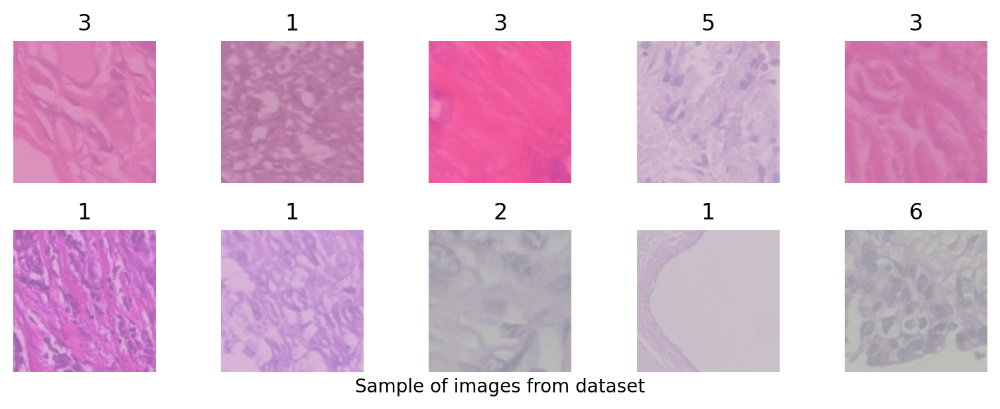

In [34]:
feature_ds = train_ds.map(af.augment_contrast)
train_sample = ivf.create_image_set(feature_ds, num_images=10)
ivf.plot_images(train_sample, nrows=2, ncols=5)


## Edges

Using the sobel-edge detection algorithms allows us to explore the differences in vertical and horizontal edges. Often tissues are represented different if they are cancerous.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


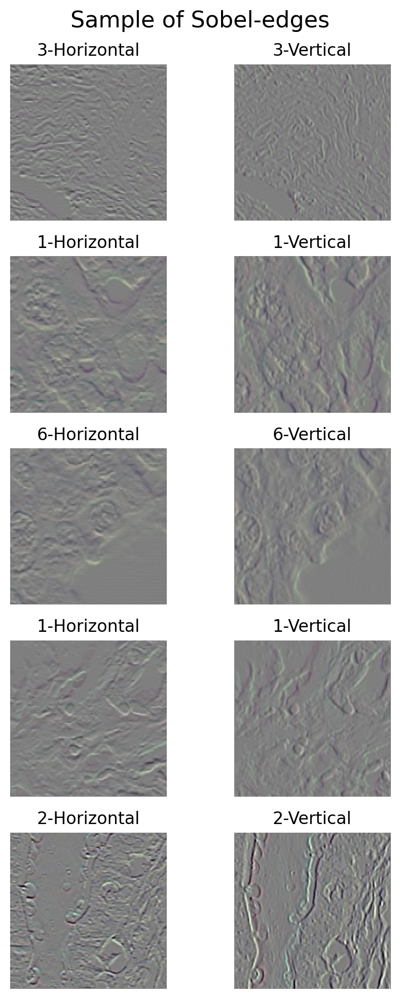

In [35]:
feature_ds = train_ds.map(af.augment_sobel_edges)
train_sample = ivf.create_image_set(feature_ds, num_images=5)
ivf.plot_sobel_images(train_sample)


## Discussion on chosen features


There is some variation seen in the histogram profiles of the tumor slides. This can be due to area of white space in the field of view. We imagine this will impact the accuracy of our models. For example, imagine that the training set gets slides with more vacules and ducts that are hollow structures. The bisection of these tissues may create a bias in the model that looks for these structures as a way to classify the images. When infact the tumor lies in the soft and muscle tissue residing in the slides.

The texture is another feature we selected because the differences in morphology should be key give-aways to the tumor type and class. A person could expect to see abberant grow in regions were a tumor is present. It can be difficult to determine the region of interest for these slides. Edges may help us to deal with the high amount of white pixels as well as understanding the morphology of the tissue. 

Lastly, we introduce random flips horizontally and vertically to add more variation to the training set. This is in hope of capturing the difference ways slides could be created. When sectioning the tissue onto the slide, unless they are extremely skilled technican or pathologist, maintaining the orientation is a difficult task. 

The features that appear to be the most useful are the contrast, histogram normalization, and the texture of the images using the edges. Our hope is that by adding in these features to our models it will help to the layers learn the small differences between the eight sub-categories. To begin we start by testing CNN models for binary classification. This is the first decision point in classifing the breast tissue biopsys.


---


# Classification Models


For our classifers we chose to use we created three different classifiers.

1. CNN Binary Classifier for Benign v. Malignant
2. Classification By Random Forest
3. ResNet Classifer for 8 classes


In [36]:
# for collecting model results
model_training_tracker = pd.DataFrame()
model_prediction_tracker = pd.DataFrame()

In [37]:
def track_model_results(model_name, df, model_training_tracker, result_type='training'):

    df.insert(loc=0, column='model_name', value=model_name)
    df.insert(loc=0, column='type', value=result_type)
    df.insert(loc=0, column='date',
              value=datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    df.reset_index(inplace=True)
    df.rename({'index': 'epoch'}, axis=1, inplace=True)

    df = pd.concat([model_training_tracker, df])

    display(df)

    return df


In [38]:
METRICS = [
    'accuracy',
    keras.metrics.TruePositives(name='tp', thresholds=0),
    keras.metrics.FalsePositives(name='fp', thresholds=0),
    keras.metrics.TrueNegatives(name='tn', thresholds=0),
    keras.metrics.FalseNegatives(name='fn', thresholds=0),
    keras.metrics.Precision(name='precision'),
    keras.metrics.Recall(name='recall'),
    keras.metrics.AUC(name='auc'),
    keras.metrics.AUC(name='prc', curve='PR'),  # precision-recall curve
]


In [39]:
def prepare_ds(ds, shuffle=False, augment=False, batch_size=32):
    """ Prepare dataset for models. Augmentation can be appliied with the flag"""

    # create square image
    image_size = 224

    resize_rescale_layer = tf.keras.Sequential([
        tf.keras.layers.RandomCrop(
            image_size, image_size, seed=seed
        )
    ])

    data_aug_layer = tf.keras.Sequential([
        tf.keras.layers.RandomFlip("horizontal_and_vertical", seed=seed),
        tf.keras.layers.RandomRotation(0.2, seed=seed),
        tf.keras.layers.RandomContrast(0.2, seed=seed),
    ])

    # Resize and rescale all datasets.
    ds = ds.map(lambda x, y: (resize_rescale_layer(x), y),
                num_parallel_calls=AUTOTUNE)

    if shuffle:
        ds = ds.shuffle(1000)

    # Use data augmentation only on the training set.
    if augment:
        ds = ds.map(lambda x, y: (data_aug_layer(x, training=True), y),
                    num_parallel_calls=AUTOTUNE)

        # ds = ds.map(lambda x, y:(histogram_equalization(x), y), num_parallel_calls = AUTOTUNE)

    # Batch all datasets.
    # ds = ds.batch(batch_size)
    ds = dcf.configure_for_performance(ds)

    return ds


## Under Sampling Method


One method to deal with class imbalances found in this dataset is to undersample. This is a limiting approach that removes potentially helpful data. The benefit of this is that we do not have to generate synthetic data for the training and undersampled classes. That approach may lead us to overfit our models since the nodes would have certain weights reinforced by the repeated data.


## Base Model


In [40]:
x = df[['FULL_PATH']]
y = df[['TUMOR_CLASS']]

rus = RandomUnderSampler()

x_under, y_under = rus.fit_resample(x, y)

df_under = pd.concat([x_under, y_under], axis=1)
del x_under, y_under

display(df_under.TUMOR_CLASS.value_counts())

ds_under, le_under = dcf.create_one_hot_encoding(
    file_paths=df_under['FULL_PATH'], labels=df_under['TUMOR_CLASS'])


B    2480
M    2480
Name: TUMOR_CLASS, dtype: int64

In [41]:
batch_size = 32
shape = (224, 224, 3)

# split up data
train_ds_binary, val_ds_binary, test_ds_binary = dcf.split_ds_tvt(ds_under)

# Create training objects
pathsTrain = []
labelsTrain = []

for x, y in train_ds_binary:
    pathsTrain.append(x.numpy().decode('utf-8'))
    labelsTrain.append(y.numpy())

pathsVal = []
labelsVal = []

for x, y in val_ds_binary:
    pathsVal.append(x.numpy().decode('utf-8'))
    labelsVal.append(y.numpy())

# Create data generators for resnet function
train_generator_binary = dg.breakHis_DataGenerator(
    pathsTrain, labelsTrain, batch_size, shape, use_cache=False, augment=False, shuffle=True)
val_generator_binary = dg.breakHis_DataGenerator(
    pathsVal, labelsVal, batch_size, shape, use_cache=False, shuffle=False)


# Create tensor datasets for faster training
# optimize
train_ds_binary = dcf.optimize_tensor(train_ds_binary)
val_ds_binary = dcf.optimize_tensor(val_ds_binary)

# read in and augment data
train_ds_binary = dcf.read_ds(train_ds_binary, dcf.read_image)
val_ds_binary = dcf.read_ds(val_ds_binary, dcf.read_image)

# Pre-process the training data
tds_contrast = train_ds_binary.map(af.augment_contrast)

# histogram equalized training set
temp = train_ds_binary.batch(32)
train_imgs, train_labels = get_tensor_image_labels(temp)
he_train_imgs = [histogram_equalization(im) for im in train_imgs]
tds_histeq = dcf.create_tf_ds(he_train_imgs, train_labels)

# sobel edges
tds_sobel_edges = train_ds_binary.map(af.augment_sobel_edges)

# setting up the testing dataset
test_ds_binary = test_ds_binary.map(
    dcf.read_image).cache().map(dcf.augment_crop).batch(32)
test_labels_binary = dcf.decoder(test_ds_binary)

# Labels for the sets
test_binary_labels = dcf.decoder(test_ds_binary)
train_labels = dcf.decoder(train_generator_binary)


3472
992
992


In [42]:
# Binary Model
num_classes = 2
image_size = 224
epochs = 10
model_name = 'model_binary_base_rgb'

# Create model
model_binary = tf.keras.Sequential([
    tf.keras.layers.Input((image_size, image_size, 3)),
    # same as kernel size of (3,3)
    tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Flatten(name='features_base_binary'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(num_classes, activation='softmax')
])


model_binary.summary()

# Compiling the model
model_binary.compile(loss=tf.keras.losses.CategoricalCrossentropy(
    from_logits=False), optimizer=mf.get_optimizer(), metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=10)
checkpoint = ModelCheckpoint(
    f"../models/checkpoints/{model_name}/", save_best_only=True,)

tensorboard_callback = mf.create_tf_board(model_name)

# Model is fitted using train and validation generator for 200 epochs
hist_base_binary = model_binary.fit(train_generator_binary,
                                    validation_data=val_generator_binary,
                                    epochs=epochs,
                                    callbacks=[early_stop, checkpoint,
                                               tensorboard_callback],
                                    verbose=1)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 64)     0         
 )                                                               
                                                                 
 features_base_binary (Flatt  (None, 802816)           0         
 en)                                                             
                                                                 
 dense (Dense)               (None, 128)               102760576 
                                                                 
 dense_1 (Dense)             (None, 2)                 258       
                                                                 
Total params: 102,762,626
Trainable params: 102,762,626


INFO:tensorflow:Assets written to: ../models/checkpoints/model_binary_base_rgb\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_binary_base_rgb\assets


109/109 [==============================] - 201s 2s/step - loss: 4.1831 - accuracy: 0.7025 - val_loss: 0.5164 - val_accuracy: 0.7480
Epoch 2/10
109/109 [==============================] - 187s 2s/step - loss: 0.5266 - accuracy: 0.7572 - val_loss: 0.5393 - val_accuracy: 0.7510
Epoch 3/10
109/109 [==============================] - 164s 2s/step - loss: 0.5076 - accuracy: 0.7713 - val_loss: 0.5289 - val_accuracy: 0.7520
Epoch 4/10
109/109 [==============================] - ETA: 0s - loss: 0.4856 - accuracy: 0.7918

INFO:tensorflow:Assets written to: ../models/checkpoints/model_binary_base_rgb\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_binary_base_rgb\assets


109/109 [==============================] - 172s 2s/step - loss: 0.4856 - accuracy: 0.7918 - val_loss: 0.4897 - val_accuracy: 0.7964
Epoch 5/10
109/109 [==============================] - ETA: 0s - loss: 0.4781 - accuracy: 0.7872

INFO:tensorflow:Assets written to: ../models/checkpoints/model_binary_base_rgb\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_binary_base_rgb\assets


109/109 [==============================] - 180s 2s/step - loss: 0.4781 - accuracy: 0.7872 - val_loss: 0.4891 - val_accuracy: 0.7802
Epoch 6/10
109/109 [==============================] - ETA: 0s - loss: 0.4739 - accuracy: 0.7923

INFO:tensorflow:Assets written to: ../models/checkpoints/model_binary_base_rgb\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_binary_base_rgb\assets


109/109 [==============================] - 178s 2s/step - loss: 0.4739 - accuracy: 0.7923 - val_loss: 0.4724 - val_accuracy: 0.8014
Epoch 7/10
109/109 [==============================] - 169s 2s/step - loss: 0.4715 - accuracy: 0.7889 - val_loss: 0.4810 - val_accuracy: 0.7792
Epoch 8/10
109/109 [==============================] - ETA: 0s - loss: 0.4714 - accuracy: 0.7866

INFO:tensorflow:Assets written to: ../models/checkpoints/model_binary_base_rgb\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_binary_base_rgb\assets


109/109 [==============================] - 174s 2s/step - loss: 0.4714 - accuracy: 0.7866 - val_loss: 0.4663 - val_accuracy: 0.7823
Epoch 9/10
109/109 [==============================] - 164s 2s/step - loss: 0.4654 - accuracy: 0.7935 - val_loss: 0.4715 - val_accuracy: 0.7913
Epoch 10/10
109/109 [==============================] - 163s 1s/step - loss: 0.4681 - accuracy: 0.7958 - val_loss: 0.5235 - val_accuracy: 0.7470


,epoch,date,type,model_name,loss,accuracy,val_loss,val_accuracy
0,0,20230424-101722,training,model_binary_base__underSampling_rgb,4.183094,0.702477,0.516397,0.747984
1,1,20230424-101722,training,model_binary_base__underSampling_rgb,0.526556,0.757200,0.539260,0.751008
2,2,20230424-101722,training,model_binary_base__underSampling_rgb,0.507560,0.771313,0.528900,0.752016
3,3,20230424-101722,training,model_binary_base__underSampling_rgb,0.485607,0.791763,0.489685,0.796371
4,4,20230424-101722,training,model_binary_base__underSampling_rgb,0.478142,0.787154,0.489112,0.780242
5,5,20230424-101722,training,model_binary_base__underSampling_rgb,0.473947,0.792339,0.472433,0.801411
6,6,20230424-101722,training,model_binary_base__underSampling_rgb,0.471490,0.788882,0.481010,0.779234
7,7,20230424-101722,training,model_binary_base__underSampling_rgb,0.471386,0.786578,0.466265,0.782258
8,8,20230424-101722,training,model_binary_base__underSampling_rgb,0.465432,0.793491,0.471463,0.791331
9,9,20230424-101722,training,model_binary_base__underSampling_rgb,0.468113,0.795795,0.523501,0.746976


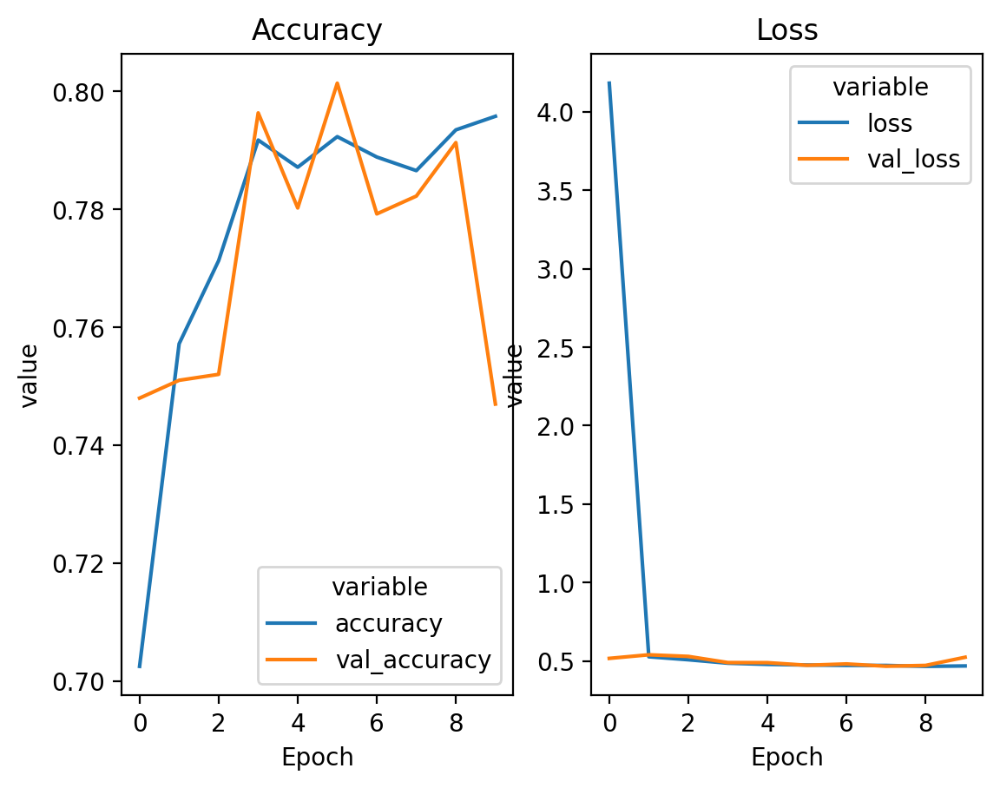

In [43]:
hist_df = pd.DataFrame(hist_base_binary.history)

model_training_tracker = track_model_results(
    'model_binary_base__underSampling_rgb', hist_df, model_training_tracker)

# plot model training results
mf.plot_hist(hist_base_binary)


In [44]:
model_path = f'../models/{model_name}_' + \
    datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + '.h5'
model_binary.save(model_path)


In [45]:
train_predictions_binary = model_binary.predict(
    train_generator_binary).argmax(axis=1)
test_predictions_binary = model_binary.predict(test_ds_binary).argmax(axis=1)

test_predictions_binary = le_under.inverse_transform(test_predictions_binary)
test_labels_binary = le_under.inverse_transform(test_labels_binary)


31/31 [==============================] - 5s 143ms/step


              precision    recall  f1-score   support

           B       0.90      0.53      0.66       480
           M       0.68      0.94      0.79       512

    accuracy                           0.74       992
   macro avg       0.79      0.73      0.73       992
weighted avg       0.78      0.74      0.73       992



,True Negatives,False Positives,False Negatives,True Positives,Total Correct Cases,Total Cases
0,252,228,29,483,735,992


,True Negatives,False Positives,False Negatives,True Positives,Total Correct Cases,Total Cases
0,252,228,29,483,735,992


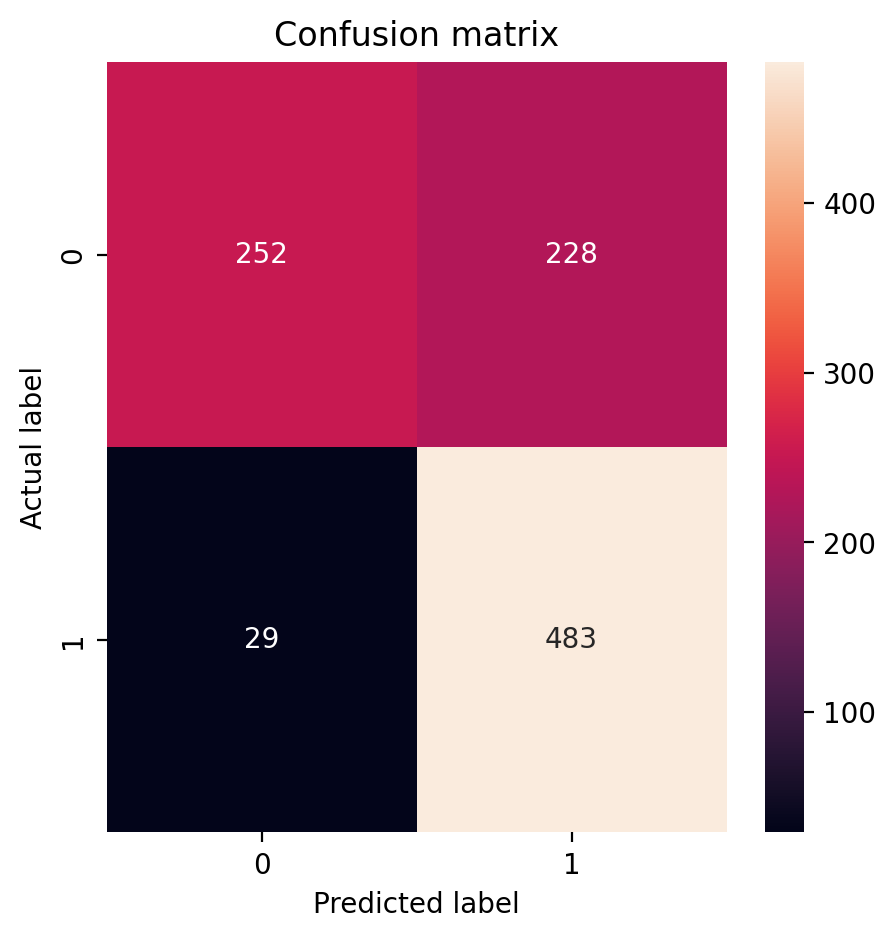

In [46]:
print(classification_report(test_labels_binary, test_predictions_binary))

mf.multi_label_cm(test_labels_binary, test_predictions_binary)

In [47]:
model_binary.save(f'../models/{model_name}.h5')


### A model architecutre from Spanhol et al. 2016


In [48]:
# multiclassifcation model(s)
num_classes = 2
image_size = 224
epochs = 10
model_name = 'model_cnn_binary'


def create_cancer_model():
    """ """
    model = tf.keras.Sequential([
        # CNN
        tf.keras.layers.Input((224, 224, 3)),
        Conv2D(filters=32, kernel_size=(3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(filters=32, kernel_size=(3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(filters=32, kernel_size=(3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(0.4),
        Conv2D(filters=32, kernel_size=(3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(0.4),
        Flatten(name='feature_extractor'),
        Dense(256, activation='relu'),
        Dense(125, activation='relu'),
        Dense(2, activation='softmax')
    ])

    return model


model_cnn_binary = create_cancer_model()

# Compiling the model
model_cnn_binary.compile(loss=tf.keras.losses.CategoricalCrossentropy(
    from_logits=False), optimizer=mf.get_optimizer(), metrics=['accuracy'])

# Call Backs
early_stop = EarlyStopping(monitor='val_loss', patience=10)
checkpoint = ModelCheckpoint(
    f"../models/checkpoints/{model_name}/", save_best_only=True,)

tensorboard_callback = mf.create_tf_board(model_name)

# Model is fitted using train and validation generator for 200 epochs
hist_cnn_binary = model_cnn_binary.fit(train_generator_binary,
                                         validation_data=val_generator_binary,
                                         epochs=epochs,
                                         callbacks=[
                                             early_stop, checkpoint, tensorboard_callback],
                                         verbose=1)


Epoch 1/10
109/109 [==============================] - ETA: 0s - loss: 0.5812 - accuracy: 0.7105

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_binary\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_binary\assets


109/109 [==============================] - 107s 971ms/step - loss: 0.5812 - accuracy: 0.7105 - val_loss: 0.5184 - val_accuracy: 0.7722
Epoch 2/10
109/109 [==============================] - ETA: 0s - loss: 0.4918 - accuracy: 0.7837

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_binary\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_binary\assets


109/109 [==============================] - 105s 968ms/step - loss: 0.4918 - accuracy: 0.7837 - val_loss: 0.5156 - val_accuracy: 0.7732
Epoch 3/10
109/109 [==============================] - 102s 941ms/step - loss: 0.4794 - accuracy: 0.7944 - val_loss: 0.5412 - val_accuracy: 0.7500
Epoch 4/10
109/109 [==============================] - ETA: 0s - loss: 0.4737 - accuracy: 0.7972

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_binary\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_binary\assets


109/109 [==============================] - 104s 958ms/step - loss: 0.4737 - accuracy: 0.7972 - val_loss: 0.4971 - val_accuracy: 0.8044
Epoch 5/10
109/109 [==============================] - ETA: 0s - loss: 0.4606 - accuracy: 0.8073

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_binary\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_binary\assets


109/109 [==============================] - 102s 939ms/step - loss: 0.4606 - accuracy: 0.8073 - val_loss: 0.4762 - val_accuracy: 0.7994
Epoch 6/10
109/109 [==============================] - 99s 908ms/step - loss: 0.4605 - accuracy: 0.8033 - val_loss: 0.4789 - val_accuracy: 0.8085
Epoch 7/10
109/109 [==============================] - ETA: 0s - loss: 0.4535 - accuracy: 0.8122

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_binary\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_binary\assets


109/109 [==============================] - 102s 939ms/step - loss: 0.4535 - accuracy: 0.8122 - val_loss: 0.4522 - val_accuracy: 0.8185
Epoch 8/10
109/109 [==============================] - ETA: 0s - loss: 0.4475 - accuracy: 0.8093

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_binary\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_binary\assets


109/109 [==============================] - 101s 933ms/step - loss: 0.4475 - accuracy: 0.8093 - val_loss: 0.4485 - val_accuracy: 0.8256
Epoch 9/10
109/109 [==============================] - 99s 910ms/step - loss: 0.4277 - accuracy: 0.8188 - val_loss: 0.4538 - val_accuracy: 0.8095
Epoch 10/10
109/109 [==============================] - ETA: 0s - loss: 0.4268 - accuracy: 0.8174

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_binary\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_binary\assets


109/109 [==============================] - 102s 937ms/step - loss: 0.4268 - accuracy: 0.8174 - val_loss: 0.4452 - val_accuracy: 0.8296


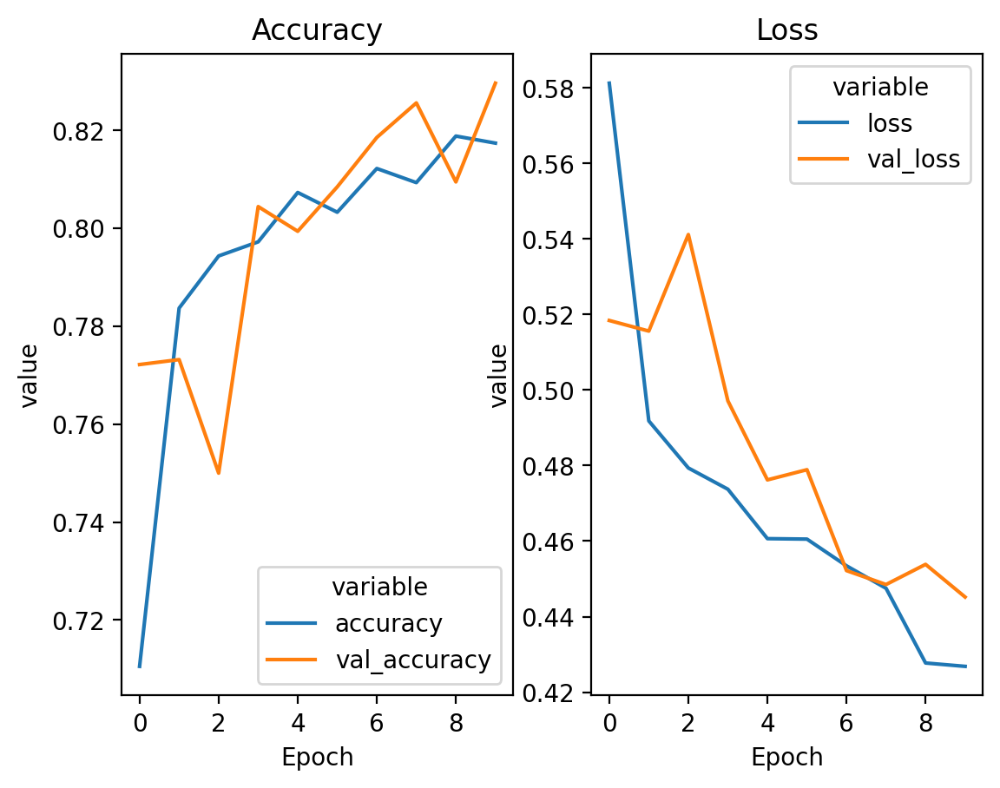

In [49]:
# plot model training results
mf.plot_hist(hist_cnn_binary)


In [50]:
cnn_hist_df = pd.DataFrame(hist_cnn_binary.history)
model_training_tracker = track_model_results(
    model_name, cnn_hist_df, model_training_tracker)
model_training_tracker


,epoch,date,type,model_name,loss,accuracy,val_loss,val_accuracy
0,0,20230424-101722,training,model_binary_base__underSampling_rgb,4.183094,0.702477,0.516397,0.747984
1,1,20230424-101722,training,model_binary_base__underSampling_rgb,0.526556,0.757200,0.539260,0.751008
2,2,20230424-101722,training,model_binary_base__underSampling_rgb,0.507560,0.771313,0.528900,0.752016
3,3,20230424-101722,training,model_binary_base__underSampling_rgb,0.485607,0.791763,0.489685,0.796371
4,4,20230424-101722,training,model_binary_base__underSampling_rgb,0.478142,0.787154,0.489112,0.780242
5,5,20230424-101722,training,model_binary_base__underSampling_rgb,0.473947,0.792339,0.472433,0.801411
6,6,20230424-101722,training,model_binary_base__underSampling_rgb,0.471490,0.788882,0.481010,0.779234
7,7,20230424-101722,training,model_binary_base__underSampling_rgb,0.471386,0.786578,0.466265,0.782258
8,8,20230424-101722,training,model_binary_base__underSampling_rgb,0.465432,0.793491,0.471463,0.791331
9,9,20230424-101722,training,model_binary_base__underSampling_rgb,0.468113,0.795795,0.523501,0.746976


,epoch,date,type,model_name,loss,accuracy,val_loss,val_accuracy
0,0,20230424-101722,training,model_binary_base__underSampling_rgb,4.183094,0.702477,0.516397,0.747984
1,1,20230424-101722,training,model_binary_base__underSampling_rgb,0.526556,0.757200,0.539260,0.751008
2,2,20230424-101722,training,model_binary_base__underSampling_rgb,0.507560,0.771313,0.528900,0.752016
3,3,20230424-101722,training,model_binary_base__underSampling_rgb,0.485607,0.791763,0.489685,0.796371
4,4,20230424-101722,training,model_binary_base__underSampling_rgb,0.478142,0.787154,0.489112,0.780242
5,5,20230424-101722,training,model_binary_base__underSampling_rgb,0.473947,0.792339,0.472433,0.801411
6,6,20230424-101722,training,model_binary_base__underSampling_rgb,0.471490,0.788882,0.481010,0.779234
7,7,20230424-101722,training,model_binary_base__underSampling_rgb,0.471386,0.786578,0.466265,0.782258
8,8,20230424-101722,training,model_binary_base__underSampling_rgb,0.465432,0.793491,0.471463,0.791331
9,9,20230424-101722,training,model_binary_base__underSampling_rgb,0.468113,0.795795,0.523501,0.746976


31/31 [==============================] - 2s 62ms/step
              precision    recall  f1-score   support

           B       0.89      0.72      0.79       480
           M       0.78      0.92      0.84       512

    accuracy                           0.82       992
   macro avg       0.83      0.82      0.82       992
weighted avg       0.83      0.82      0.82       992



,True Negatives,False Positives,False Negatives,True Positives,Total Correct Cases,Total Cases
0,344,136,42,470,814,992


,True Negatives,False Positives,False Negatives,True Positives,Total Correct Cases,Total Cases
0,344,136,42,470,814,992


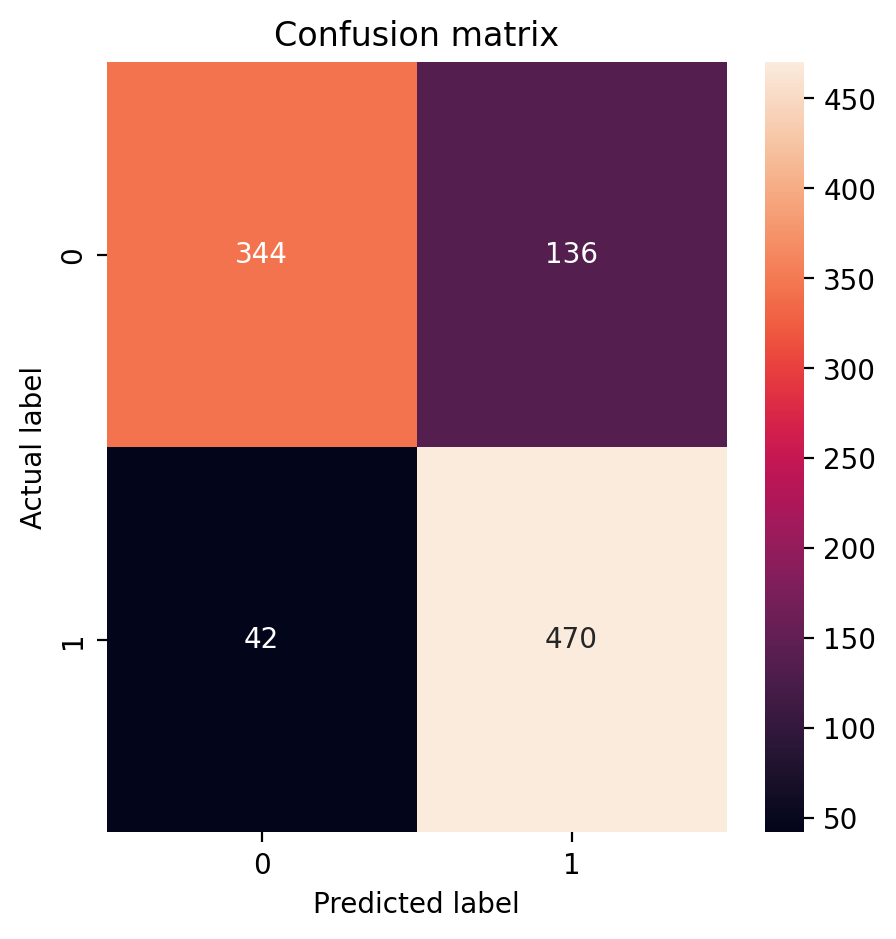

In [51]:
train_predictions_cnn_binary = model_cnn_binary.predict(
    train_generator_binary).argmax(axis=1)
test_predictions_cnn_binary = model_cnn_binary.predict(
    test_ds_binary).argmax(axis=1)

test_predictions_cnn_binary = le_under.inverse_transform(
    test_predictions_cnn_binary)

print(classification_report(test_labels_binary, test_predictions_cnn_binary))

mf.multi_label_cm(test_labels_binary, test_predictions_cnn_binary)


In [52]:
model_path = f'../models/{model_name}_' + \
    datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + '.h5'
model_cnn_binary.save(model_path)


In [53]:
# load model
# new_model = tf.keras.models.load_model(model_path)


#### Random Forest

strategy is to take feature_extractor, last flatten layer, and pass into RF.

using sklearn.ensemble.RandomForestClassifier. Takes the categories and not one hot encoded varaiables


In [54]:
new_model = tf.keras.models.load_model(model_path)
new_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 109, 109, 32)      9248      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 54, 54, 32)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 52, 52, 32)        9248      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 26, 26, 32)      

In [55]:
feature_extractor = Sequential()
feature_extractor.add(tf.keras.layers.Input((224, 224, 3)))
for layer in new_model.layers[:-3]:  # go through until last layer
    feature_extractor.add(layer)

feature_extractor.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 109, 109, 32)      9248      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 54, 54, 32)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 52, 52, 32)        9248      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 26, 26, 32)      

In [56]:
# Features
X_rf = feature_extractor.predict(train_generator_binary)


109/109 [==============================] - 63s 582ms/step


In [57]:
# setup model
from sklearn.ensemble import RandomForestClassifier
rf_model = RandomForestClassifier(n_estimators=50, random_state=26)


In [58]:
test_ds_rf_features, test_ds_rf_labels = get_tensor_image_labels(
    test_ds_binary)


In [59]:
test_ds_rf_labels = le_under.inverse_transform(
    test_ds_rf_labels.argmax(axis=-1))


In [60]:
# Train modle
rf_hist = rf_model.fit(X_rf, train_labels)


In [61]:
# predictions
X_test_rf = feature_extractor.predict(test_ds_rf_features)

prediction_rf = rf_model.predict(X_test_rf)
prediction_rf_labels = le_under.inverse_transform(prediction_rf)


31/31 [==============================] - 2s 57ms/step


              precision    recall  f1-score   support

           B       0.49      0.59      0.53       480
           M       0.53      0.43      0.48       512

    accuracy                           0.51       992
   macro avg       0.51      0.51      0.51       992
weighted avg       0.51      0.51      0.50       992



,True Negatives,False Positives,False Negatives,True Positives,Total Correct Cases,Total Cases
0,281,199,290,222,503,992


,True Negatives,False Positives,False Negatives,True Positives,Total Correct Cases,Total Cases
0,281,199,290,222,503,992


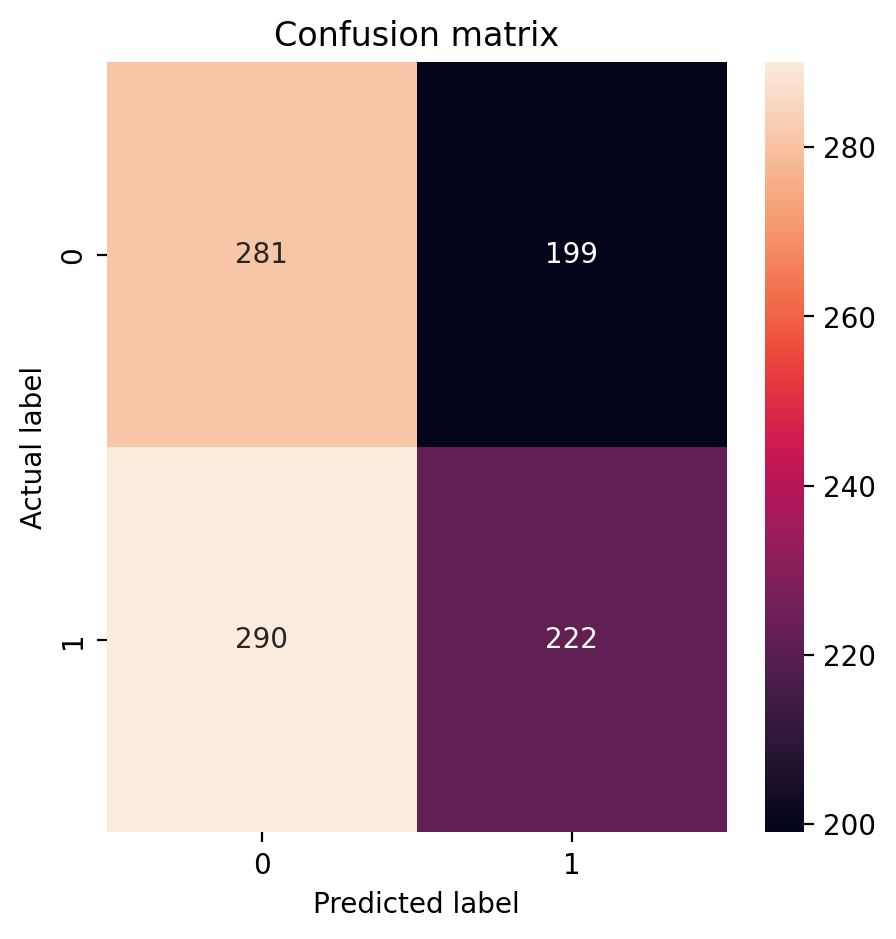

In [62]:
# train_predictions = model.predict(train_ds).argmax(axis=1)
# test_predictions = prediction_rf_labels.argmax(axis=1)

print(classification_report(test_ds_rf_labels, prediction_rf_labels))

mf.multi_label_cm(test_ds_rf_labels, prediction_rf_labels)


### Res Net Classifier Binary


In [63]:
# hard coded variables
batch_size = 32
num_classes = 2
shape = (224, 224, 3)
model_name = 'rs50_binary_rgb'


In [64]:
learning_rate = 0.001
optimizer = tf.keras.optimizers.SGD(
    lr=learning_rate, momentum=0.5, nesterov=True)


Epoch 1/200
109/109 [==============================] - ETA: 0s - loss: 0.6873 - accuracy: 0.5196WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 64 batches). You may need to use the repeat() function when building your dataset.


INFO:tensorflow:Assets written to: ../models/checkpoints/rs50_binary_rgb\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/rs50_binary_rgb\assets


109/109 [==============================] - 198s 2s/step - loss: 0.6873 - accuracy: 0.5196 - val_loss: 0.6992 - val_accuracy: 0.5292
Epoch 2/200
109/109 [==============================] - ETA: 0s - loss: 0.6717 - accuracy: 0.5654WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 129s 1s/step - loss: 0.6717 - accuracy: 0.5654
Epoch 3/200
109/109 [==============================] - ETA: 0s - loss: 0.6631 - accuracy: 0.5760WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 129s 1s/step - loss: 0.6631 - accuracy: 0.5760
Epoch 4/200
109/109 [==============================] - ETA: 0s - loss: 0.6503 - accuracy: 0.6215WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 129s 1s/step - loss: 0.6503 - accuracy: 0.6215
Epoch 5/200
109/109 [==============================] - ETA: 0s - loss: 0.6400 - accuracy: 0.6325WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 130s 1s/step - loss: 0.6400 - accuracy: 0.6325
Epoch 6/200
109/109 [==============================] - ETA: 0s - loss: 0.6252 - accuracy: 0.6558WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 129s 1s/step - loss: 0.6252 - accuracy: 0.6558
Epoch 7/200
109/109 [==============================] - ETA: 0s - loss: 0.6213 - accuracy: 0.6564WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 127s 1s/step - loss: 0.6213 - accuracy: 0.6564
Epoch 8/200
109/109 [==============================] - ETA: 0s - loss: 0.6036 - accuracy: 0.6838WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 127s 1s/step - loss: 0.6036 - accuracy: 0.6838
Epoch 9/200
109/109 [==============================] - ETA: 0s - loss: 0.5901 - accuracy: 0.6875WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5901 - accuracy: 0.6875
Epoch 10/200
109/109 [==============================] - ETA: 0s - loss: 0.5781 - accuracy: 0.6999WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 129s 1s/step - loss: 0.5781 - accuracy: 0.6999
Epoch 11/200
109/109 [==============================] - ETA: 0s - loss: 0.5670 - accuracy: 0.7082WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5670 - accuracy: 0.7082
Epoch 12/200
109/109 [==============================] - ETA: 0s - loss: 0.5602 - accuracy: 0.7169WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5602 - accuracy: 0.7169
Epoch 13/200
109/109 [==============================] - ETA: 0s - loss: 0.5603 - accuracy: 0.7117WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5603 - accuracy: 0.7117
Epoch 14/200
109/109 [==============================] - ETA: 0s - loss: 0.5601 - accuracy: 0.7175WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5601 - accuracy: 0.7175
Epoch 15/200
109/109 [==============================] - ETA: 0s - loss: 0.5556 - accuracy: 0.7244WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 129s 1s/step - loss: 0.5556 - accuracy: 0.7244
Epoch 16/200
109/109 [==============================] - ETA: 0s - loss: 0.5469 - accuracy: 0.7275WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5469 - accuracy: 0.7275
Epoch 17/200
109/109 [==============================] - ETA: 0s - loss: 0.5392 - accuracy: 0.7324WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 127s 1s/step - loss: 0.5392 - accuracy: 0.7324
Epoch 18/200
109/109 [==============================] - ETA: 0s - loss: 0.5385 - accuracy: 0.7333WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5385 - accuracy: 0.7333
Epoch 19/200
109/109 [==============================] - ETA: 0s - loss: 0.5384 - accuracy: 0.7324WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5384 - accuracy: 0.7324
Epoch 20/200
109/109 [==============================] - ETA: 0s - loss: 0.5380 - accuracy: 0.7344WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 129s 1s/step - loss: 0.5380 - accuracy: 0.7344
Epoch 21/200
109/109 [==============================] - ETA: 0s - loss: 0.5376 - accuracy: 0.7379WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5376 - accuracy: 0.7379
Epoch 22/200
109/109 [==============================] - ETA: 0s - loss: 0.5232 - accuracy: 0.7454WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5232 - accuracy: 0.7454
Epoch 23/200
109/109 [==============================] - ETA: 0s - loss: 0.5192 - accuracy: 0.7514WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5192 - accuracy: 0.7514
Epoch 24/200
109/109 [==============================] - ETA: 0s - loss: 0.5271 - accuracy: 0.7425WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5271 - accuracy: 0.7425
Epoch 25/200
109/109 [==============================] - ETA: 0s - loss: 0.5250 - accuracy: 0.7460WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 130s 1s/step - loss: 0.5250 - accuracy: 0.7460
Epoch 26/200
109/109 [==============================] - ETA: 0s - loss: 0.5180 - accuracy: 0.7457WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 129s 1s/step - loss: 0.5180 - accuracy: 0.7457
Epoch 27/200
109/109 [==============================] - ETA: 0s - loss: 0.5187 - accuracy: 0.7463WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5187 - accuracy: 0.7463
Epoch 28/200
109/109 [==============================] - ETA: 0s - loss: 0.5253 - accuracy: 0.7454WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5253 - accuracy: 0.7454
Epoch 29/200
109/109 [==============================] - ETA: 0s - loss: 0.5267 - accuracy: 0.7434WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5267 - accuracy: 0.7434
Epoch 30/200
109/109 [==============================] - ETA: 0s - loss: 0.5198 - accuracy: 0.7546WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5198 - accuracy: 0.7546
Epoch 31/200
109/109 [==============================] - ETA: 0s - loss: 0.5136 - accuracy: 0.7465WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5136 - accuracy: 0.7465
Epoch 32/200
109/109 [==============================] - ETA: 0s - loss: 0.5102 - accuracy: 0.7569WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5102 - accuracy: 0.7569
Epoch 33/200
109/109 [==============================] - ETA: 0s - loss: 0.5180 - accuracy: 0.7416WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5180 - accuracy: 0.7416
Epoch 34/200
109/109 [==============================] - ETA: 0s - loss: 0.5133 - accuracy: 0.7526WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5133 - accuracy: 0.7526
Epoch 35/200
109/109 [==============================] - ETA: 0s - loss: 0.5192 - accuracy: 0.7457WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 129s 1s/step - loss: 0.5192 - accuracy: 0.7457
Epoch 36/200
109/109 [==============================] - ETA: 0s - loss: 0.5107 - accuracy: 0.7604WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5107 - accuracy: 0.7604
Epoch 37/200
109/109 [==============================] - ETA: 0s - loss: 0.5057 - accuracy: 0.7589WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5057 - accuracy: 0.7589
Epoch 38/200
109/109 [==============================] - ETA: 0s - loss: 0.5036 - accuracy: 0.7572WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5036 - accuracy: 0.7572
Epoch 39/200
109/109 [==============================] - ETA: 0s - loss: 0.5115 - accuracy: 0.7509WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5115 - accuracy: 0.7509
Epoch 40/200
109/109 [==============================] - ETA: 0s - loss: 0.5100 - accuracy: 0.7543WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 129s 1s/step - loss: 0.5100 - accuracy: 0.7543
Epoch 41/200
109/109 [==============================] - ETA: 0s - loss: 0.5140 - accuracy: 0.7514WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5140 - accuracy: 0.7514
Epoch 42/200
109/109 [==============================] - ETA: 0s - loss: 0.4998 - accuracy: 0.7540WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 127s 1s/step - loss: 0.4998 - accuracy: 0.7540
Epoch 43/200
109/109 [==============================] - ETA: 0s - loss: 0.5070 - accuracy: 0.7540WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5070 - accuracy: 0.7540
Epoch 44/200
109/109 [==============================] - ETA: 0s - loss: 0.5024 - accuracy: 0.7667WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5024 - accuracy: 0.7667
Epoch 45/200
109/109 [==============================] - ETA: 0s - loss: 0.5083 - accuracy: 0.7563WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5083 - accuracy: 0.7563
Epoch 46/200
109/109 [==============================] - ETA: 0s - loss: 0.5020 - accuracy: 0.7555WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.5020 - accuracy: 0.7555
Epoch 47/200
109/109 [==============================] - ETA: 0s - loss: 0.4978 - accuracy: 0.7578WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 127s 1s/step - loss: 0.4978 - accuracy: 0.7578
Epoch 48/200
109/109 [==============================] - ETA: 0s - loss: 0.5039 - accuracy: 0.7575WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 127s 1s/step - loss: 0.5039 - accuracy: 0.7575
Epoch 49/200
109/109 [==============================] - ETA: 0s - loss: 0.4952 - accuracy: 0.7621WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.4952 - accuracy: 0.7621
Epoch 50/200
109/109 [==============================] - ETA: 0s - loss: 0.4896 - accuracy: 0.7687WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.4896 - accuracy: 0.7687
Epoch 51/200
109/109 [==============================] - ETA: 0s - loss: 0.4907 - accuracy: 0.7609WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.4907 - accuracy: 0.7609
Epoch 52/200
109/109 [==============================] - ETA: 0s - loss: 0.4987 - accuracy: 0.7569WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 129s 1s/step - loss: 0.4987 - accuracy: 0.7569
Epoch 53/200
109/109 [==============================] - ETA: 0s - loss: 0.4999 - accuracy: 0.7607WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 127s 1s/step - loss: 0.4999 - accuracy: 0.7607
Epoch 54/200
109/109 [==============================] - ETA: 0s - loss: 0.4897 - accuracy: 0.7656WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 128s 1s/step - loss: 0.4897 - accuracy: 0.7656
Epoch 55/200
109/109 [==============================] - ETA: 0s - loss: 0.4916 - accuracy: 0.7664WARNING:tensorflow:Can save best model only with val_loss available, skipping.


109/109 [==============================] - 130s 1s/step - loss: 0.4916 - accuracy: 0.7664


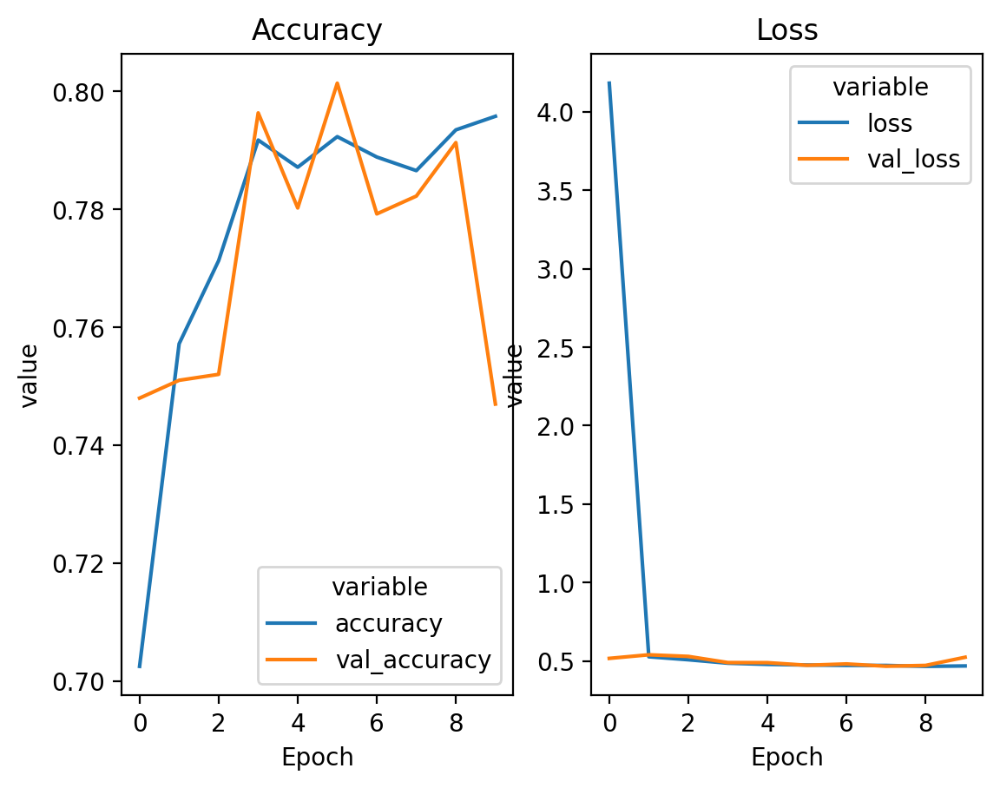

In [65]:
# initiate resnet50 model1
rs50_base = tf.keras.applications.ResNet50(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
)

# set trainability for layers
for layer in rs50_base.layers[0:-10]:
    layer.trainable = False
for layer in rs50_base.layers[-10:-1]:
    layer.trainable = True

# Add last layers to fit shape of data and number of classes
rs50 = tf.keras.layers.GlobalAveragePooling2D(
    name='2DGAP_custom')(rs50_base.output)
rs50 = tf.keras.layers.Dense(
    1024, activation='relu', name='dense_custom1024')(rs50)
rs50_features = tf.keras.layers.Flatten(name='last_flat')(rs50)
rs50 = tf.keras.layers.Dense(
    num_classes, activation='softmax', name='dense_prediction')(rs50_features)

rs50 = tf.keras.Model(inputs=rs50_base.inputs, outputs=rs50)

rs50.compile(loss=tf.keras.losses.CategoricalCrossentropy(
    from_logits=False), optimizer=optimizer, metrics=['accuracy'])


# Setup call backs
early_stop = EarlyStopping(monitor='loss', patience=5)
checkpoint = ModelCheckpoint(
    f"../models/checkpoints/{model_name}/", save_best_only=True,)

tensorboard_callback = mf.create_tf_board(model_name)

# Train Model
rs50_binary_hist = rs50.fit(
    train_generator_binary,
    steps_per_epoch=len(train_generator_binary),
    validation_data=val_generator_binary,
    validation_steps=64,
    verbose=1,
    epochs=200,
    callbacks=[early_stop, checkpoint, tensorboard_callback])

# hist_df = pd.DataFrame(rs50_binary_hist.history)

# model_training_tracker = track_model_results(model_name, hist_df, model_training_tracker)

# plot model training results
mf.plot_hist(hist_base_binary)

model_path = f'../models/{model_name}_' + \
    datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + '.h5'
rs50.save(model_path)


In [92]:
rs50.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [66]:
model_path = f'../models/{model_name}_' + \
    datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + '.h5'
rs50.save(model_path)


31/31 [==============================] - 24s 773ms/step
              precision    recall  f1-score   support

           0       0.48      1.00      0.65       480
           1       1.00      0.00      0.01       512

    accuracy                           0.49       992
   macro avg       0.74      0.50      0.33       992
weighted avg       0.75      0.49      0.32       992

True Negatives:  480
False Positives:  0
False Negatives:  510
True Positives:  2
Total Malignant Cases:  512


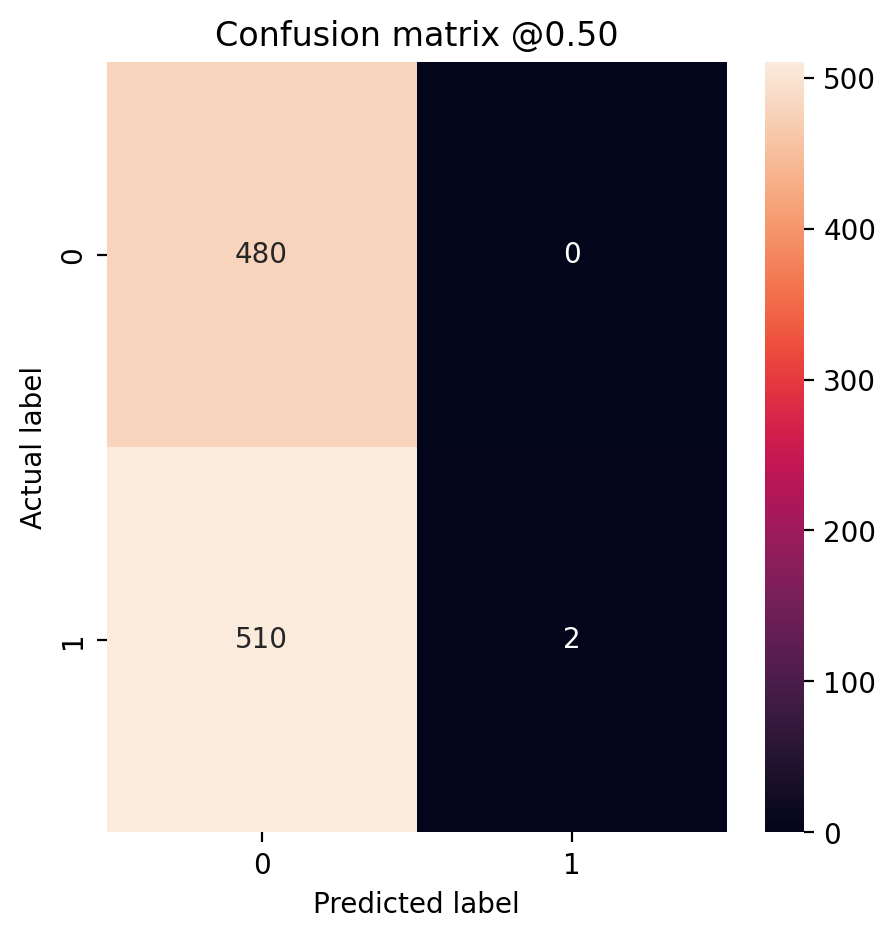

In [84]:
train_predictions_rs50_binary = rs50.predict(
    train_generator_binary).argmax(axis=1)
test_predictions_rs50_binary = rs50.predict(test_ds_binary).argmax(axis=1)

# test_predictions_rs50_binary = le_under.inverse_transform(test_predictions_rs50_binary)

print(classification_report(test_labels_binary, test_predictions_rs50_binary))

test_labels_binary_int = pd.Series(test_labels_binary).replace({"B":0, "M":1})

mf.plot_cm(test_labels_binary_int, test_predictions_rs50_binary)


# Multiclass classification


Engineering soble-edges, because texture appears to play a large role in classifcaitons


In [24]:
# split up data
batch_size = 32
shape = (224,224,3)

train_ds_multi, val_ds_multi, test_ds_multi = dcf.preprocess_ds(ds_under)

train_ds_multi = train_ds_multi.batch(batch_size)
val_ds_multi = val_ds_multi.batch(batch_size)
test_ds_multi = test_ds_multi.batch(batch_size)

2486
711
710


In [27]:
# actual labels
test_multi_labels = dcf.decoder(test_ds_multi)
test_multi_labels_text = le_under.inverse_transform(test_multi_labels)

In [ ]:
create_generator = False

if create_generator: 
    test_ds_multi = test_ds_multi.map(dcf.read_image).map(dcf.augment_crop).batch(32)
    test_labels_multi = dcf.decoder(test_ds_multi)

    # Create training objects
    pathsTrain = []
    labelsTrain = []

    for x, y in train_ds_multi:
        pathsTrain.append(x.numpy().decode('utf-8'))
        labelsTrain.append(y.numpy())

    pathsVal = []
    labelsVal = []

    for x, y in val_ds_multi:
        pathsVal.append(x.numpy().decode('utf-8'))
        labelsVal.append(y.numpy())
        
    # Create data generators for resnet function
    train_generator_multi = dg.breakHis_DataGenerator(
        pathsTrain, labelsTrain, batch_size, shape, use_cache=False, augment=False, shuffle=True)
    val_generator_multi = dg.breakHis_DataGenerator(
        pathsVal, labelsVal, batch_size, shape, use_cache=False, shuffle=False)


## CNN Model


In [103]:
# multiclassifcation model(s)
num_classes = 8
image_size = 224
epochs = 25
model_name = 'model_cnn_multiclass'

model_cnn_multiclass = tf.keras.Sequential([
    # CNN
    tf.keras.layers.Input((224, 224, 3)),
    Conv2D(filters=32, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(filters=32, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(filters=32, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.4),
    Conv2D(filters=32, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.4),
    Flatten(name='feature_extractor'),
    Dense(256, activation='relu'),
    Dense(125, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Compiling the model
model_cnn_multiclass.compile(loss=tf.keras.losses.CategoricalCrossentropy(
    from_logits=False), optimizer=mf.get_optimizer(), metrics=['accuracy'])

model_cnn_multiclass.summary() 

# Call Backs
early_stop = EarlyStopping(monitor='val_loss', patience=10)
checkpoint = ModelCheckpoint(
    f"../models/checkpoints/{model_name}/", save_best_only=True,)

tensorboard_callback = mf.create_tf_board(model_name)

# Model is fitted using train and validation generator for 200 epochs
model_cnn_multiclass_hist = model_cnn_multiclass.fit(train_ds_multi,
                                                       validation_data=val_ds_multi,
                                                       epochs=epochs,
                                                       callbacks=[
                                                           early_stop, checkpoint, tensorboard_callback],
                                                       verbose=1)


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_13 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 111, 111, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 109, 109, 32)      9248      
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 54, 54, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_15 (Conv2D)          (None, 52, 52, 32)        9248      
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 26, 26, 32)      

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


173/173 [==============================] - 177s 1s/step - loss: 1.6637 - accuracy: 0.4539 - val_loss: 1.6732 - val_accuracy: 0.4927
Epoch 2/25
173/173 [==============================] - ETA: 0s - loss: 1.5540 - accuracy: 0.4846

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


173/173 [==============================] - 166s 961ms/step - loss: 1.5540 - accuracy: 0.4846 - val_loss: 1.6694 - val_accuracy: 0.4972
Epoch 3/25
173/173 [==============================] - ETA: 0s - loss: 1.5004 - accuracy: 0.4978

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


173/173 [==============================] - 164s 949ms/step - loss: 1.5004 - accuracy: 0.4978 - val_loss: 1.5504 - val_accuracy: 0.4997
Epoch 4/25
173/173 [==============================] - ETA: 0s - loss: 1.4724 - accuracy: 0.5023

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


173/173 [==============================] - 166s 960ms/step - loss: 1.4724 - accuracy: 0.5023 - val_loss: 1.5496 - val_accuracy: 0.5111
Epoch 5/25
173/173 [==============================] - ETA: 0s - loss: 1.4462 - accuracy: 0.5117

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


173/173 [==============================] - 166s 958ms/step - loss: 1.4462 - accuracy: 0.5117 - val_loss: 1.5034 - val_accuracy: 0.5294
Epoch 6/25
173/173 [==============================] - 161s 932ms/step - loss: 1.4246 - accuracy: 0.5188 - val_loss: 1.5349 - val_accuracy: 0.5098
Epoch 7/25
173/173 [==============================] - ETA: 0s - loss: 1.4041 - accuracy: 0.5228

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


173/173 [==============================] - 163s 944ms/step - loss: 1.4041 - accuracy: 0.5228 - val_loss: 1.4555 - val_accuracy: 0.5300
Epoch 8/25
173/173 [==============================] - 160s 927ms/step - loss: 1.3960 - accuracy: 0.5215 - val_loss: 1.4890 - val_accuracy: 0.5224
Epoch 9/25
173/173 [==============================] - 163s 942ms/step - loss: 1.3665 - accuracy: 0.5240 - val_loss: 1.4629 - val_accuracy: 0.5338
Epoch 10/25
173/173 [==============================] - ETA: 0s - loss: 1.3547 - accuracy: 0.5247

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


173/173 [==============================] - 167s 965ms/step - loss: 1.3547 - accuracy: 0.5247 - val_loss: 1.4350 - val_accuracy: 0.5351
Epoch 11/25
173/173 [==============================] - ETA: 0s - loss: 1.3492 - accuracy: 0.5260

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


173/173 [==============================] - 163s 945ms/step - loss: 1.3492 - accuracy: 0.5260 - val_loss: 1.4046 - val_accuracy: 0.5363
Epoch 12/25
173/173 [==============================] - 163s 943ms/step - loss: 1.3284 - accuracy: 0.5296 - val_loss: 1.4577 - val_accuracy: 0.5256
Epoch 13/25
173/173 [==============================] - 161s 930ms/step - loss: 1.3111 - accuracy: 0.5341 - val_loss: 1.4953 - val_accuracy: 0.5256
Epoch 14/25
173/173 [==============================] - ETA: 0s - loss: 1.3184 - accuracy: 0.5372

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


173/173 [==============================] - 165s 953ms/step - loss: 1.3184 - accuracy: 0.5372 - val_loss: 1.4037 - val_accuracy: 0.5527
Epoch 15/25
173/173 [==============================] - 163s 943ms/step - loss: 1.2967 - accuracy: 0.5408 - val_loss: 1.4306 - val_accuracy: 0.5426
Epoch 16/25
173/173 [==============================] - 160s 925ms/step - loss: 1.2993 - accuracy: 0.5408 - val_loss: 1.4603 - val_accuracy: 0.5351
Epoch 17/25
173/173 [==============================] - 160s 928ms/step - loss: 1.2888 - accuracy: 0.5430 - val_loss: 1.4564 - val_accuracy: 0.5395
Epoch 18/25
173/173 [==============================] - 159s 920ms/step - loss: 1.2841 - accuracy: 0.5401 - val_loss: 1.4153 - val_accuracy: 0.5559
Epoch 19/25
173/173 [==============================] - ETA: 0s - loss: 1.2821 - accuracy: 0.5435

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


173/173 [==============================] - 163s 942ms/step - loss: 1.2821 - accuracy: 0.5435 - val_loss: 1.3999 - val_accuracy: 0.5509
Epoch 20/25
173/173 [==============================] - 161s 930ms/step - loss: 1.2693 - accuracy: 0.5471 - val_loss: 1.4164 - val_accuracy: 0.5414
Epoch 21/25
173/173 [==============================] - ETA: 0s - loss: 1.2731 - accuracy: 0.5506

INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


INFO:tensorflow:Assets written to: ../models/checkpoints/model_amir_multiclass\assets


173/173 [==============================] - 162s 936ms/step - loss: 1.2731 - accuracy: 0.5506 - val_loss: 1.3752 - val_accuracy: 0.5622
Epoch 22/25
173/173 [==============================] - 161s 932ms/step - loss: 1.2609 - accuracy: 0.5484 - val_loss: 1.4446 - val_accuracy: 0.5281
Epoch 23/25
173/173 [==============================] - 159s 921ms/step - loss: 1.2625 - accuracy: 0.5482 - val_loss: 1.4078 - val_accuracy: 0.5584
Epoch 24/25
173/173 [==============================] - 160s 925ms/step - loss: 1.2596 - accuracy: 0.5495 - val_loss: 1.3857 - val_accuracy: 0.5458
Epoch 25/25
173/173 [==============================] - 160s 926ms/step - loss: 1.2674 - accuracy: 0.5504 - val_loss: 1.4200 - val_accuracy: 0.5376


In [104]:
# Save History
cnn_hist_df = pd.DataFrame(model_cnn_multiclass_hist.history)
model_training_tracker = track_model_results(
    model_name, cnn_hist_df, model_training_tracker)

,epoch,date,type,model_name,loss,accuracy,val_loss,val_accuracy
0,0,20230424-101722,training,model_binary_base__underSampling_rgb,4.183094,0.702477,0.516397,0.747984
1,1,20230424-101722,training,model_binary_base__underSampling_rgb,0.526556,0.757200,0.539260,0.751008
2,2,20230424-101722,training,model_binary_base__underSampling_rgb,0.507560,0.771313,0.528900,0.752016
3,3,20230424-101722,training,model_binary_base__underSampling_rgb,0.485607,0.791763,0.489685,0.796371
4,4,20230424-101722,training,model_binary_base__underSampling_rgb,0.478142,0.787154,0.489112,0.780242
...,...,...,...,...,...,...,...,...
20,20,20230425-000730,training,model_amir_multiclass,1.273097,0.550578,1.375151,0.562224
21,21,20230425-000730,training,model_amir_multiclass,1.260883,0.548410,1.444561,0.528111
22,22,20230425-000730,training,model_amir_multiclass,1.262522,0.548230,1.407831,0.558433
23,23,20230425-000730,training,model_amir_multiclass,1.259571,0.549494,1.385683,0.545799


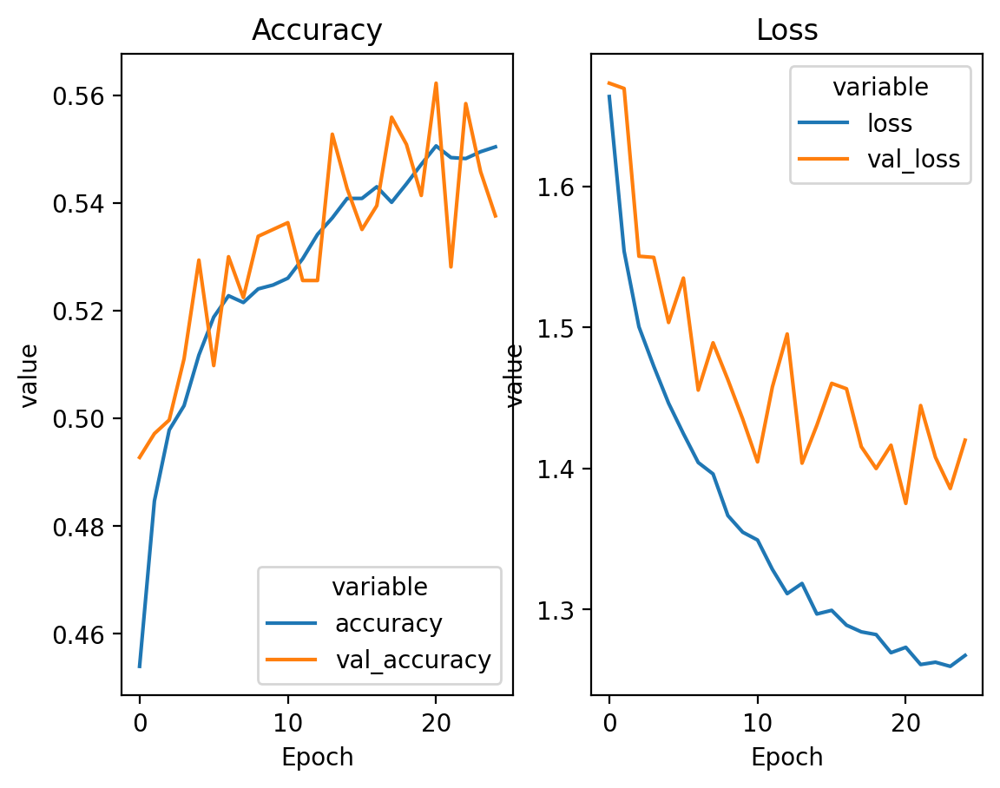

In [113]:
# plot model training results
mf.plot_hist(model_cnn_multiclass_hist)

In [114]:
# Create predictions and view confusion matrix
train_predictions_cnn_binary = model_cnn_multiclass.predict(
    train_generator_multi).argmax(axis=1)

test_predictions_cnn_multi = model_cnn_multiclass.predict(
    test_ds_multi).argmax(axis=1)

test_prediction_labels_cnn_multi = le_og.inverse_transform(
    test_predictions_cnn_multi)

50/50 [==============================] - 27s 541ms/step


In [119]:
test_labels_multi_text = le_og.inverse_transform(
    test_labels_multi)

array(['DC', 'DC', 'A', ..., 'DC', 'DC', 'PC'], dtype=object)

              precision    recall  f1-score   support

           A       0.07      0.13      0.09        84
          DC       0.47      0.54      0.50       728
           F       0.13      0.25      0.17       188
          LC       0.04      0.02      0.03       106
          MC       0.08      0.02      0.03       151
          PC       0.00      0.00      0.00       116
          PT       0.00      0.00      0.00        77
          TA       0.11      0.08      0.09       131

    accuracy                           0.29      1581
   macro avg       0.11      0.13      0.11      1581
weighted avg       0.25      0.29      0.27      1581



,True Negatives,False Positives,False Negatives,True Positives,Total Correct Cases,Total Cases
0,11,35,68,390,401,1581


,True Negatives,False Positives,False Negatives,True Positives,Total Correct Cases,Total Cases
0,11,35,68,390,401,1581


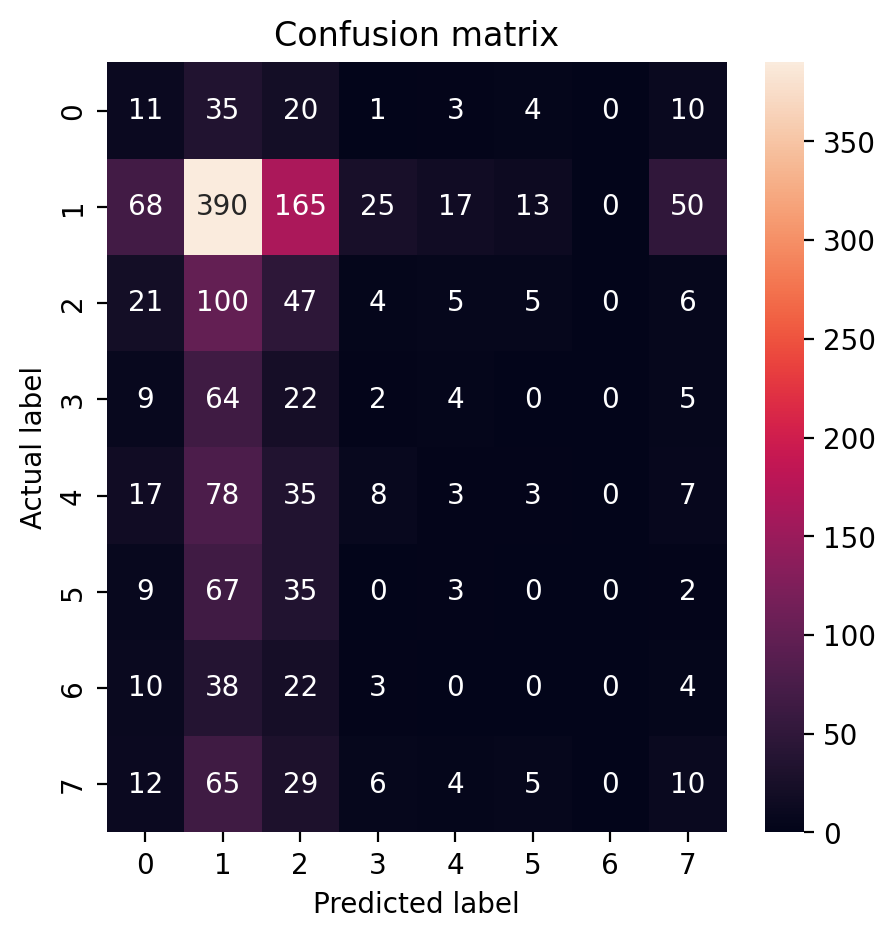

In [121]:
print(classification_report(test_labels_multi_text, test_prediction_labels_cnn_multi))

mf.multi_label_cm(test_labels_multi_text, test_prediction_labels_cnn_multi)


In [123]:
# Save the Model
model_path = f'../../models/{model_name}_' + \
    datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + '.h5'
model_amir_multiclass.save(model_path)

### Res Net Classifier Multiclassification
For this resnet model, we will be using the smote over sampling method. Creating the synethetic data for the under represented classes will help to balance the label predictions. All tumor classes have been oversampled to match the number of DC samples in the training set. 

In [31]:
batch_size = 32
num_classes = 8
shape = (224, 224, 3)
model_name = 'rs50_multi_under'

train_ds_multi, val_ds_multi, test_ds_multi = dcf.preprocess_ds(ds_under)

train_ds_multi = train_ds_multi.batch(batch_size)
val_ds_multi = val_ds_multi.batch(batch_size)
test_ds_multi = test_ds_multi.batch(batch_size)

2486
711
710


In [32]:
# actual labels
test_multi_labels = dcf.decoder(test_ds_multi)
test_multi_labels_text = le_under.inverse_transform(test_multi_labels)

In [33]:
create_generator = False

if create_generator: 
    test_ds_multi = test_ds_multi.map(dcf.read_image).map(dcf.augment_crop).batch(32)
    test_labels_multi = dcf.decoder(test_ds_multi)

    # Create training objects
    pathsTrain = []
    labelsTrain = []

    for x, y in train_ds_multi:
        pathsTrain.append(x.numpy().decode('utf-8'))
        labelsTrain.append(y.numpy())

    pathsVal = []
    labelsVal = []

    for x, y in val_ds_multi:
        pathsVal.append(x.numpy().decode('utf-8'))
        labelsVal.append(y.numpy())
        
    # Create data generators for resnet function
    train_generator_multi = dg.breakHis_DataGenerator(
        pathsTrain, labelsTrain, batch_size, shape, use_cache=False, augment=False, shuffle=True)
    val_generator_multi = dg.breakHis_DataGenerator(
        pathsVal, labelsVal, batch_size, shape, use_cache=False, shuffle=False)


In [34]:
learning_rate = 0.001
optimizer = tf.keras.optimizers.SGD(
    lr=learning_rate,
    momentum=0.5,
    nesterov=True)


# initiate resnet50 model1
rs50_base = tf.keras.applications.ResNet50(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
)

# set trainability for layers
for layer in rs50_base.layers[0:-10]:
    layer.trainable = False
for layer in rs50_base.layers[-10:-1]:
    layer.trainable = True

# Add last layers to fit shape of data and number of classes
rs50_multi_smote = tf.keras.layers.GlobalAveragePooling2D()(rs50_base.output)
rs50_multi_smote = tf.keras.layers.Dense(1024, activation='relu')(rs50_multi_smote)
rs50_features = tf.keras.layers.Flatten()(rs50_multi_smote)
rs50_multi_smote = tf.keras.layers.Dense(num_classes, activation='softmax')(rs50_features)

rs50_multi_smote = tf.keras.Model(inputs=rs50_base.inputs, outputs=rs50_multi_smote)

rs50_multi_smote.compile(loss=tf.keras.losses.CategoricalCrossentropy(
    from_logits=False), optimizer=optimizer, metrics=['accuracy'])

rs50_multi_smote.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [35]:
# Setup call backs
early_stop = EarlyStopping(monitor='val_loss', patience=5)
checkpoint = ModelCheckpoint(f"../models/{model_name}/", save_best_only=True,)
tensorboard_callback = mf.create_tf_board(model_name)

# Train Model
rs50_multi_hist = rs50_multi_smote.fit(
    train_ds_multi,
    steps_per_epoch=len(train_ds_multi),
    validation_data=val_ds_multi,
    validation_steps=10,
    verbose=1,
    epochs=25,
    callbacks=[early_stop, checkpoint, tensorboard_callback]
    )


Epoch 1/25
11/78 [===>..........................] - ETA: 1:16 - loss: 2.0985 - accuracy: 0.1193

KeyboardInterrupt: 

In [ ]:
# Save the Model
model_path = f'../../models/{model_name}_' + \
    datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + '.h5'
rs50_multi_smote.save(model_path)

In [ ]:
# Save History
rs50_multi_hist_df = pd.DataFrame(rs50_multi_hist.history)
model_training_tracker = track_model_results(
    model_name, rs50_multi_hist_df, model_training_tracker)

In [ ]:
# plot model training results
mf.plot_hist(rs50_multi_hist_df)

In [ ]:
score = rs50.evaluate(test_ds)

In [ ]:
# Create predictions and view confusion matrix
test_predictions_rs50_multi = model_cnn_multiclass.predict(
    test_ds_multi).argmax(axis=1)

test_prediction_labels_rs50_multi = le_over_smote.inverse_transform(
    test_predictions_rs50_multi)

In [ ]:
test_labels_multi_text = le_over_smote.inverse_transform(
    test_labels_multi)

In [ ]:
print(classification_report(test_labels_multi_text, test_prediction_labels_rs50_multi))

mf.multi_label_cm(test_labels_multi_text, test_prediction_labels_rs50_multi)


In [ ]:
# Save the Model
model_path = f'../../models/{model_name}_' + \
    datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + '.h5'
rs50_multi_smote.save(model_path)

---


# Discussion

Results for other cancer detection alogirhtms include Genie Classifier algorithm (Rizzardi et al., 2012).Color Deconvolution algorithm showed promise too in this paper (Rizzardi et al., 2012). These algorithms could be used in future work to improve the results of our models. Image segmentation appears to be a large factor in determining the types of cancer present in biopsy slides based on different articles (Monkman et al. 2020). This is because it is important for pathologist need to identify the key tissues invovled in the type of carcinoma they are looking for. In breast tissue for example, if they suspect ductal carcinomia the ROI would be the ductal structures. This can be different to represent in 2D images, but the morphology could be used as features in a machine learning model.  

Additionally companies like Nanostring have developed multi-color panels to detect the presents of different antigens. These multi-plexing methods offer pathologists a way to understand the co-localization of tumor makers in samples. This could be key to understanding the inner complexities of drug resistant cancers. An example of this can be seen from figure 1 of this paper (Cancers (Basel). 2020 Dec; 12(12): 3551.). Thse algorithms are being implemented at the industry scale for high throughput testing and analysis. This aides researchers to arrive to conclusions faster to determine next steps for therapeutics. Our hope is that tools like the one we tried to develop here are eventually used in clinical settings to get patients their diagnosises faster. 


<center><img src="../imgs/nanostring_multiplex.png" alt="map of tumor classification" height = 400 width = 500/></center>


# References


1. Spanhol, F., Oliveira, L. S., Petitjean, C., Heutte, L., A Dataset for Breast Cancer Histopathological Image Classification, IEEE Transactions on Biomedical Engineering (TBME), 63(7):1455-1462, 2016. [pdf]
2. Spanhol, F., Oliveira, L. S., Petitjean, C., and Heutte, L., Breast Cancer Histopathological Image Classification using Convolutional Neural Network, International Joint Conference on Neural Networks (IJCNN 2016), Vancouver, Canada, 2016.
3. Brunyé, Tad T., Ezgi Mercan, Donald L. Weaver, and Joann G. Elmore. “Accuracy Is in the Eyes of the Pathologist: The Visual Interpretive Process and Diagnostic Accuracy with Digital Whole Slide Images.” Journal of Biomedical Informatics 66 (February 1, 2017): 171–79. https://doi.org/10.1016/j.jbi.2017.01.004.
4. Rizzardi, Anthony E., Arthur T. Johnson, Rachel Isaksson Vogel, Stefan E. Pambuccian, Jonathan Henriksen, Amy PN Skubitz, Gregory J. Metzger, and Stephen C. Schmechel. “Quantitative Comparison of Immunohistochemical Staining Measured by Digital Image Analysis versus Pathologist Visual Scoring.” Diagnostic Pathology 7, no. 1 (June 20, 2012): 42. https://doi.org/10.1186/1746-1596-7-42.
5. Monkman, J., Taheri, T., Ebrahimi Warkiani, M., O'Leary, C., Ladwa, R., Richard, D., O'Byrne, K., & Kulasinghe, A. (2020). High-Plex and High-Throughput Digital Spatial Profiling of Non-Small-Cell Lung Cancer (NSCLC). Cancers, 12(12), 3551. https://doi.org/10.3390/cancers12123551


- Data: https://www.kaggle.com/datasets/ambarish/breakhis/code
- Dataset background and collection information: https://web.inf.ufpr.br/vri/databases/breast-cancer-histopathological-database-breakhis/